# Assignment - BME20 Machine Learning in Biomedical Data Analysis

By Magdalini Anastasiadou and Maria Michailidou

We are going to tackle a Biomedical Computer Vision problem: DermaMNIST

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Setup

In [2]:
import time
import random
import itertools
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager

from collections import Counter, defaultdict
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import KFold

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

In [3]:
# Load Data
with np.load('/content/drive/My Drive/DermaMNIST_Train.npz') as data:
    x_train = data['x_train']
    y_train = data['y_train']

with np.load('/content/drive/My Drive/DermaMNIST_Test.npz') as data:
    x_test = data['x_test']
    y_test = data['y_test']

## Explore the dataset

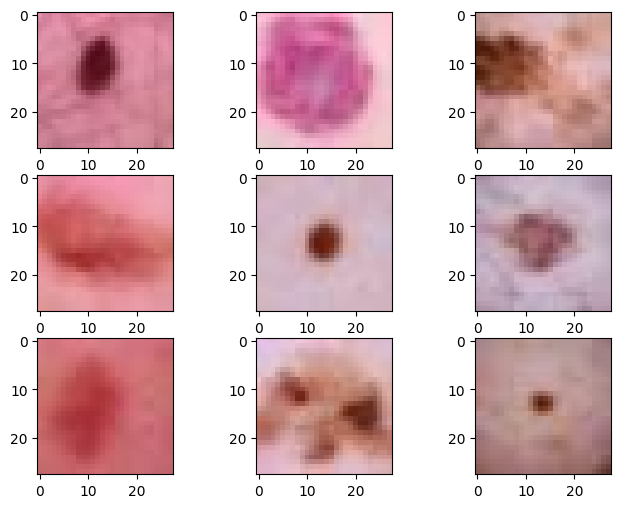

(7007, 28, 28, 3) (7007, 7)
(2005, 28, 28, 3) (2005, 7)


In [4]:
plt.figure(figsize=(8, 6))

# Plot the first 9 images on the train dataset
for i in range(9):
 # define subplot
 plt.subplot(330 + 1 + i)
 # plot raw pixel data
 plt.imshow(x_train[i], cmap=plt.get_cmap('gray'))
# show the figure
plt.show()

# These two lines will print the shape of my data
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

Identify whether the data are balanced or not

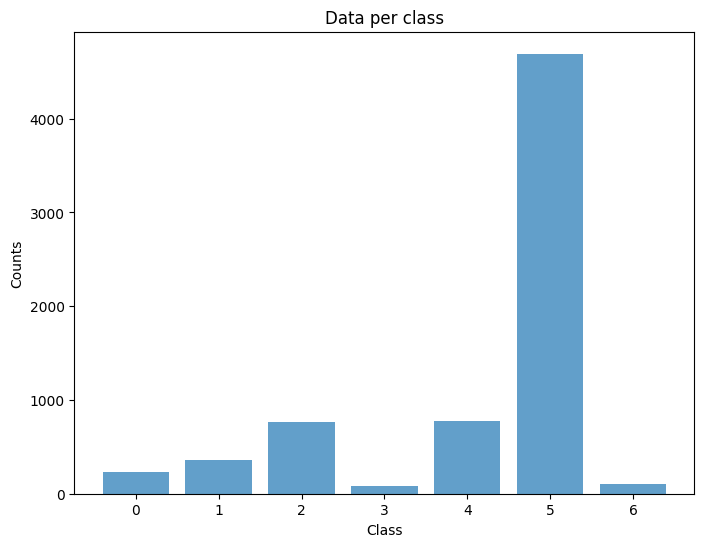

In [5]:
plt.figure(figsize=(8, 6))

y = np.argmax(y_train, axis=1)
labels, counts = zip(*sorted(Counter(y).items()))

plt.bar(labels, counts, align='center', alpha=0.7)
plt.xlabel('Class')
plt.ylabel('Counts')
plt.title('Data per class')
plt.show()

In [6]:
# Number of classes
num_classes = y_train.shape[1]

Plot data from each class

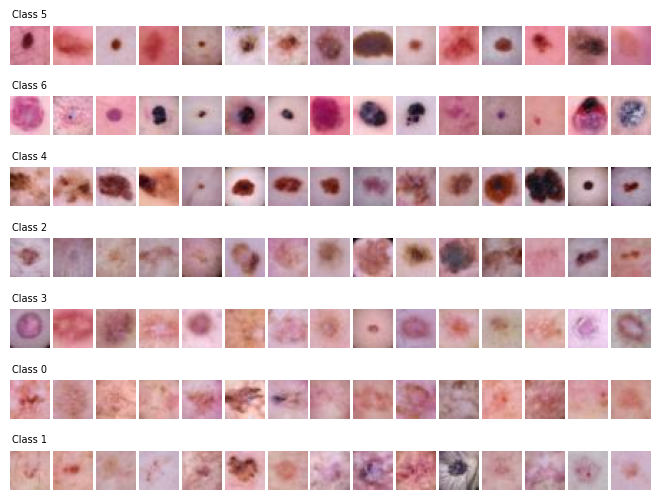

In [7]:
instances = defaultdict(list)
for instance, label in zip(x_train, y_train):
    instances[np.argmax(label)].append(instance)

fig, axs = plt.subplots(num_classes, 15, figsize=(8, 6))
fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.3, wspace=0.1)

for class_idx, (key, images) in enumerate(instances.items()):
    for img_idx in range(15):
        ax = axs[class_idx, img_idx]
        ax.imshow(images[img_idx])
        if img_idx == 0:
            ax.set_title(f'Class {key}', fontsize=7)
        ax.axis('off')

plt.show()

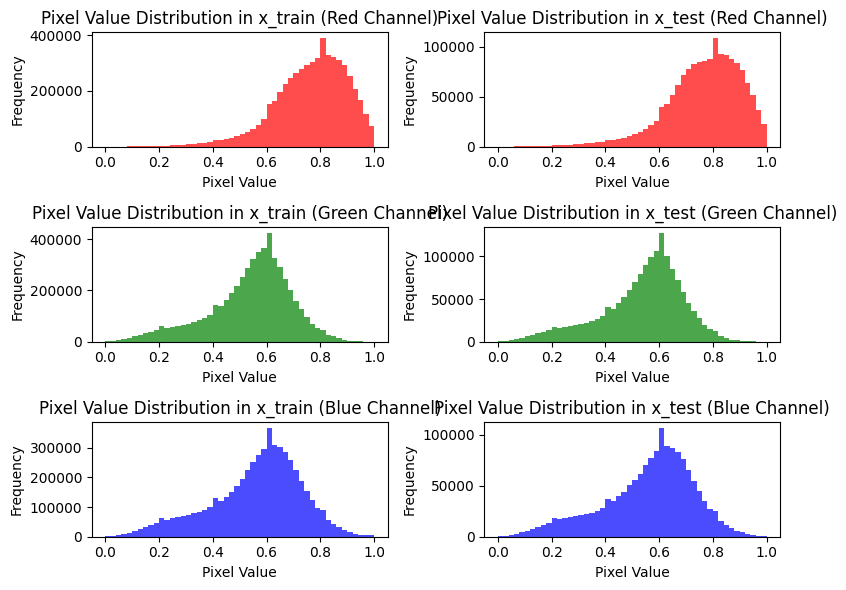

In [8]:
# Separate the RGB channels for both training and test datasets
x_train_red = x_train[:, :, :, 0].flatten()
x_train_green = x_train[:, :, :, 1].flatten()
x_train_blue = x_train[:, :, :, 2].flatten()

x_test_red = x_test[:, :, :, 0].flatten()
x_test_green = x_test[:, :, :, 1].flatten()
x_test_blue = x_test[:, :, :, 2].flatten()

# Plot histograms for each channel
plt.figure(figsize=(8, 6))

# Training data histograms
plt.subplot(3, 2, 1)
plt.hist(x_train_red, bins=50, color='red', alpha=0.7)
plt.title('Pixel Value Distribution in x_train (Red Channel)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(3, 2, 3)
plt.hist(x_train_green, bins=50, color='green', alpha=0.7)
plt.title('Pixel Value Distribution in x_train (Green Channel)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(3, 2, 5)
plt.hist(x_train_blue, bins=50, color='blue', alpha=0.7)
plt.title('Pixel Value Distribution in x_train (Blue Channel)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# Test data histograms
plt.subplot(3, 2, 2)
plt.hist(x_test_red, bins=50, color='red', alpha=0.7)
plt.title('Pixel Value Distribution in x_test (Red Channel)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(3, 2, 4)
plt.hist(x_test_green, bins=50, color='green', alpha=0.7)
plt.title('Pixel Value Distribution in x_test (Green Channel)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(3, 2, 6)
plt.hist(x_test_blue, bins=50, color='blue', alpha=0.7)
plt.title('Pixel Value Distribution in x_test (Blue Channel)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [9]:
input_shape =  28 * 28 * 3  # 28 (width) * 28 (height) * 3 (RGB channels)
x_train_flat = x_train.reshape((-1, input_shape))
x_test_flat = x_test.reshape((-1, input_shape))

## Define helper functions

In [10]:
def set_random_seed(seed):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

def create_model(config):
    """
    Creates and compiles a new model based on the configuration.

    Parameters:
        config (dict): Model configuration including layers and training parameters.

    Returns:
        Compiled keras model.
    """
    model = keras.Sequential()

    for layer in config['layers']:
        if layer['type'] == 'input':
            model.add(layers.Input(shape=layer['shape']))
        elif layer['type'] == 'rescaling':
            model.add(layers.Rescaling(scale=layer['scale']))
        elif layer['type'] == 'dense':
            model.add(layers.Dense(layer['units'], activation=layer['activation']))
        elif layer['type'] == 'dropout':
            model.add(layers.Dropout(layer['rate']))
        elif layer['type'] == 'batch_norm':
            model.add(layers.BatchNormalization())
        elif layer['type'] == 'conv2d':
            model.add(layers.Conv2D(filters=layer['filters'], kernel_size=layer['kernel_size'], activation=layer['activation']))
        elif layer['type'] == 'max_pooling2d':
            model.add(layers.MaxPooling2D(pool_size=layer['pool_size']))
        elif layer['type'] == 'flatten':
            model.add(layers.Flatten())

    model.compile(optimizer=config['optimizer']['type'](learning_rate=config['optimizer']['learning_rate']),
                  loss=config['loss'],
                  metrics=config['metrics'])
    return model


def train_model(create_fun, config, x_train, y_train, num_folds=10):
    """
    Trains a model using K-fold cross-validation based on a provided model configuration.

    Parameters:
        create_fun (function): Function to create and compile a model.
        config (dict): Configuration dictionary defining the model architecture and training parameters.
        x_train (numpy array): Training data features.
        y_train (numpy array): Training data labels.
        num_folds (int): Number of folds for K-fold cross-validation.

    Returns:
        dict: A dictionary containing training and validation metrics for each fold.
    """
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=10)
    fold_results = {f'fold_{i+1}': [] for i in range(num_folds)}

    for fold_no, (train_index, val_index) in enumerate(kf.split(x_train), start=1):
        # Create a new model for each fold
        model = create_fun(config)

        x_train_fold, x_val_fold = x_train[train_index], x_train[val_index]
        y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

        start = time.time()
        history = model.fit(x_train_fold, y_train_fold,
                            batch_size=config['batch_size'], epochs=config['epochs'],
                            validation_data=(x_val_fold, y_val_fold),
                            class_weight=config.get('class_weight', None),
                            verbose=config.get('verbose', 0), callbacks=config.get('calbacks', None))
        end = time.time()
        data = history.history
        data['time'] = end-start
        fold_results[f'fold_{fold_no}'] = data

    return fold_results

def plot_results(fold_results, info=""):
    """
    Plots the training and validation metrics over epochs for all K-folds.

    Parameters:
        fold_results (dict): A dictionary containing training and validation metrics for each fold.
        info (str): String to append in plot title.
    """
    metrics = set()
    for result in fold_results.values():
        for key in result.keys():
            if key.startswith('val_'):
                metrics.add(key[4:])  # Strip 'val_' to get the metric name
            elif key != 'time':
                metrics.add(key)

    num_folds = len(fold_results)
    key = next(iter(metrics))
    num_epochs = len(next(iter(fold_results.values()))[key])

    colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors
    colors = [colormap(i) for i in np.linspace(0, 1, num_folds * 2)]  # Generate colors

    fig, axes = plt.subplots(len(metrics), 1, figsize=(8, 8), squeeze=False)
    axes = axes.flatten()
    font = font_manager.FontProperties(size=5)
    for i, metric in enumerate(metrics):
        ax = axes[i]

        for j, (fold, result) in enumerate(fold_results.items()):
            ax.plot(result[metric], label=f'{fold} Training {metric}', color=colors[j * 2])
            ax.plot(result[f'val_{metric}'], label=f'{fold} Validation {metric}', linestyle='--')

        ax.set_title(f'{metric.capitalize()} Over Epochs\n{info}')
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric.capitalize())
        ax.legend(prop=font)

    plt.tight_layout()
    plt.show()


def compare_experiments(results_list, names_list, metric='accuracy', plot_metric='accuracy'):
    """
    Compare different model architectures based on cross-validation results, choose the best one, and create plots.

    Parameters:
    results_list (list(dict)): List of results of experiments,
                                 where each dict has keys as fold names and values as history.history dictionaries
    names_list (list(str)): List of names of experiments,
    metric (str): The metric to use for model comparison (both training and validation. Default is 'accuracy'.
    plot_metric (str): The metric to use for plotting (both training and validation). Default is 'accuracy'.

    Returns:
    int: The index of the best model in the results list.
    pd.DataFrame: A DataFrame with the mean and std performance of each model.
    """

    performance = {}
    font = font_manager.FontProperties(size=5)

    # Calculate mean and std performance for each model
    for i, fold_results in enumerate(results_list):
        train_metric_values = []
        val_metric_values = []
        time_values = []
        for fold_no, history in fold_results.items():
            time_values.append(history['time'])
            if metric in history:
                # Taking the last value of the metric (end of training)
                train_metric_values.append(history[metric][-1])
                val_metric_values.append(history[f'val_{metric}'][-1])
            else:
                raise ValueError(f"Metric '{metric}' not found in the training history for model {i}")

        train_mean_performance = np.mean(train_metric_values)
        time_mean_value = np.mean(time_values)
        time_std_value = np.std(time_values)
        train_std_performance = np.std(train_metric_values)
        val_mean_performance = np.mean(val_metric_values)
        val_std_performance = np.std(val_metric_values)
        performance[names_list[i]] = {
            'name': names_list[i],
            'train_mean': train_mean_performance,
            'train_std': train_std_performance,
            'val_mean': val_mean_performance,
            'val_std': val_std_performance,
            'time_mean': time_mean_value,
            'time_std': val_std_performance
        }

    # Identify the best model based on the highest mean performance
    best_model_index = max(range(len(results_list)), key=lambda i: performance[names_list[i]]['val_mean'])

    # Plotting results for each model and fold
    num_experiments = len(results_list)
    num_folds = len(results_list[0])  # Assuming all experiments have results for the same number of folds.
    folds_per_row = 2
    num_rows = (num_folds + 1) // folds_per_row

    plt.figure(figsize=(16, 10))

    for fold in range(1, num_folds + 1):
        fold_key = f'fold_{fold}'

        for i, exp_results in enumerate(results_list):
            exp_label = names_list[i]

            plt.subplot(num_rows, folds_per_row * 2, (fold - 1) * 2 + 1)
            plt.plot(exp_results[fold_key][plot_metric], label=f'{exp_label} Training {plot_metric}', linestyle='-')
            plt.title(f'Training {plot_metric.capitalize()} - Fold {fold}')
            plt.xlabel('Epochs')
            plt.ylabel(plot_metric.capitalize())
            plt.legend(prop=font)

            plt.subplot(num_rows, folds_per_row * 2, (fold - 1) * 2 + 2)
            plt.plot(exp_results[fold_key][f'val_{plot_metric}'], label=f'{exp_label} Validation {plot_metric}', linestyle='--')
            plt.title(f'Validation {plot_metric.capitalize()} - Fold {fold}')
            plt.xlabel('Epochs')
            plt.ylabel(plot_metric.capitalize())
            plt.legend(prop=font)

    plt.tight_layout()
    plt.show()

    return best_model_index, pd.DataFrame(performance).T


In [11]:
set_random_seed(10)

## MLP models

### Baseline model

We start with a simple multilayer percepton model with which we will compare subsequent models.

It has an input layer of shape similar to the flat image, then a dense layer with 512 units and ReLu activation and in the final layer there is a dense layer with 7 units representing each class with softmax activation.

We use 10-fold cross validation to train models with this configuration and plot the accuracy and loss in the training and validation data. We use batch size of 32 which is the default in Sequential.fit and 20 epochs. For an opimizer we use Adams, with learning rate of 0.001.

In [12]:
mlp_baseline_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 512, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 20,
    'verbose': 0
}
mlp_baseline_model = create_model(mlp_baseline_config)
print(mlp_baseline_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               1204736   
                                                                 
 dense_1 (Dense)             (None, 7)                 3591      
                                                                 
Total params: 1208327 (4.61 MB)
Trainable params: 1208327 (4.61 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [13]:
mlp_baseline_results = train_model(create_model, mlp_baseline_config, x_train_flat, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


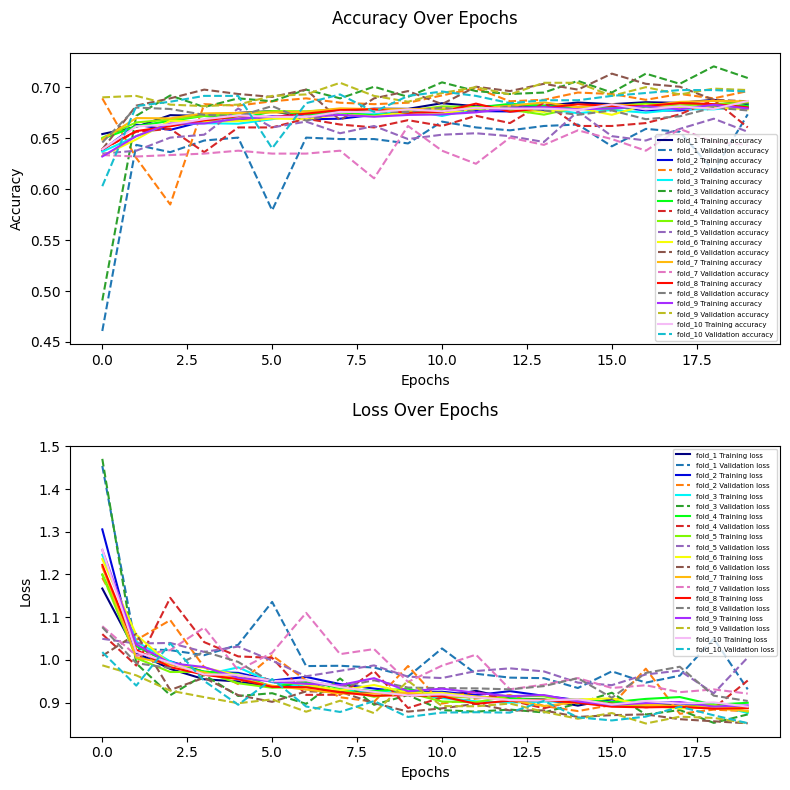

In [14]:
plot_results(mlp_baseline_results)

  The model's performance is consistent across different folds, indicating robustness. There is no significant gap between training and validation loss/accuracy, suggesting minimal overfitting. The minor fluctuations in validation metrics are typical in cross-validation and do not necessarily indicate a problem.

### Experiment 1a (2352->512->256->7)
In this experiment we experiment with adding an additional hidden layers to see if increasing model's capacity improves accuracy

In [15]:
callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

mlp_exp1a_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 512, 'activation': 'relu'},
        {'type': 'dense', 'units': 256, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 20,
    'callback': [callback]
}
mlp_exp1a_model = create_model(mlp_exp1a_config)
print(mlp_exp1a_model.summary())

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_22 (Dense)            (None, 512)               1204736   
                                                                 
 dense_23 (Dense)            (None, 256)               131328    
                                                                 
 dense_24 (Dense)            (None, 7)                 1799      
                                                                 
Total params: 1337863 (5.10 MB)
Trainable params: 1337863 (5.10 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [16]:
mlp_exp1a_results = train_model(create_model, mlp_exp1a_config, x_train_flat, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


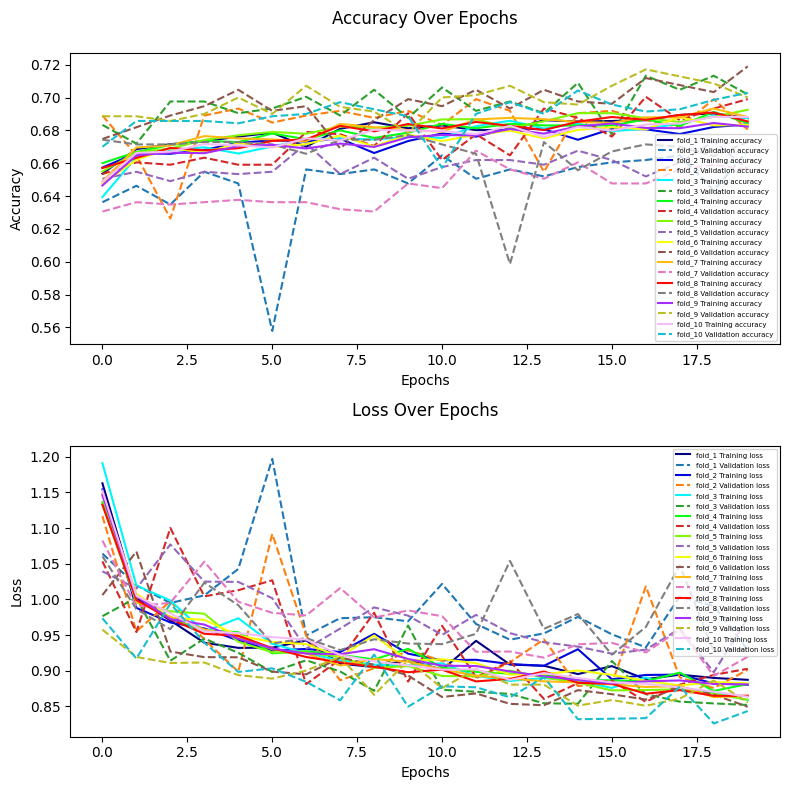

In [17]:
plot_results(mlp_exp1a_results)

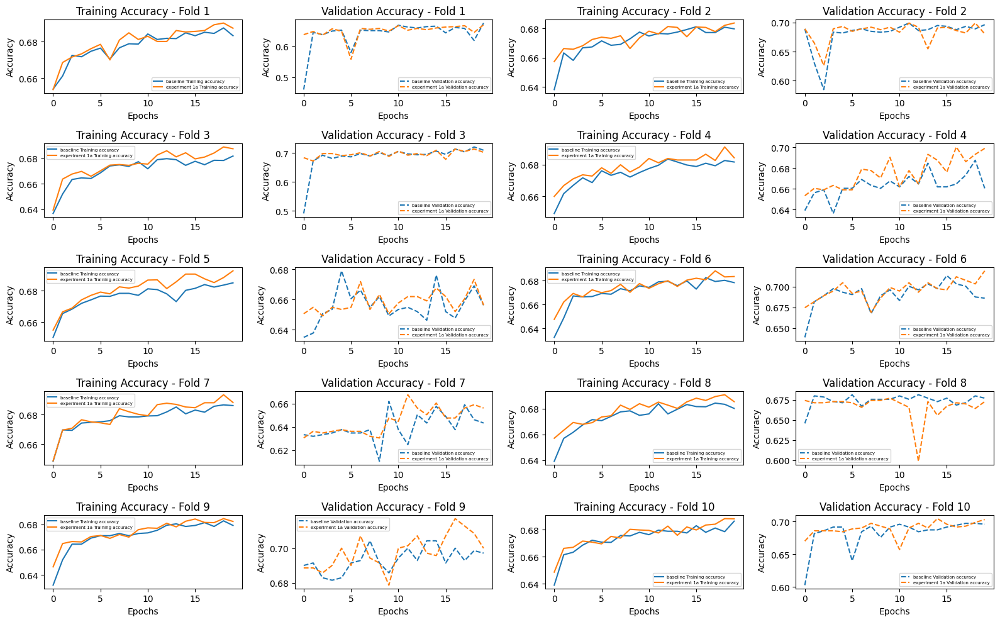

(1,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 1a  experiment 1a   0.686266  0.002903  0.685603  0.020744   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 1a  25.809294  0.020744  )

In [18]:
compare_experiments(
    [mlp_baseline_results, mlp_exp1a_results],
    ['baseline', 'experiment 1a']
)

### Experiment 1b (2352->512->256->128->7)


In [21]:
mlp_exp1b_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 512, 'activation': 'relu'},
        {'type': 'dense', 'units': 256, 'activation': 'relu'},
        {'type': 'dense', 'units': 128, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 20,
    'callback': [callback]
}
mlp_exp1b_model = create_model(mlp_exp1b_config)
print(mlp_exp1b_model.summary())

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_55 (Dense)            (None, 512)               1204736   
                                                                 
 dense_56 (Dense)            (None, 256)               131328    
                                                                 
 dense_57 (Dense)            (None, 128)               32896     
                                                                 
 dense_58 (Dense)            (None, 7)                 903       
                                                                 
Total params: 1369863 (5.23 MB)
Trainable params: 1369863 (5.23 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [22]:
mlp_exp1b_results = train_model(create_model, mlp_exp1b_config, x_train_flat, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


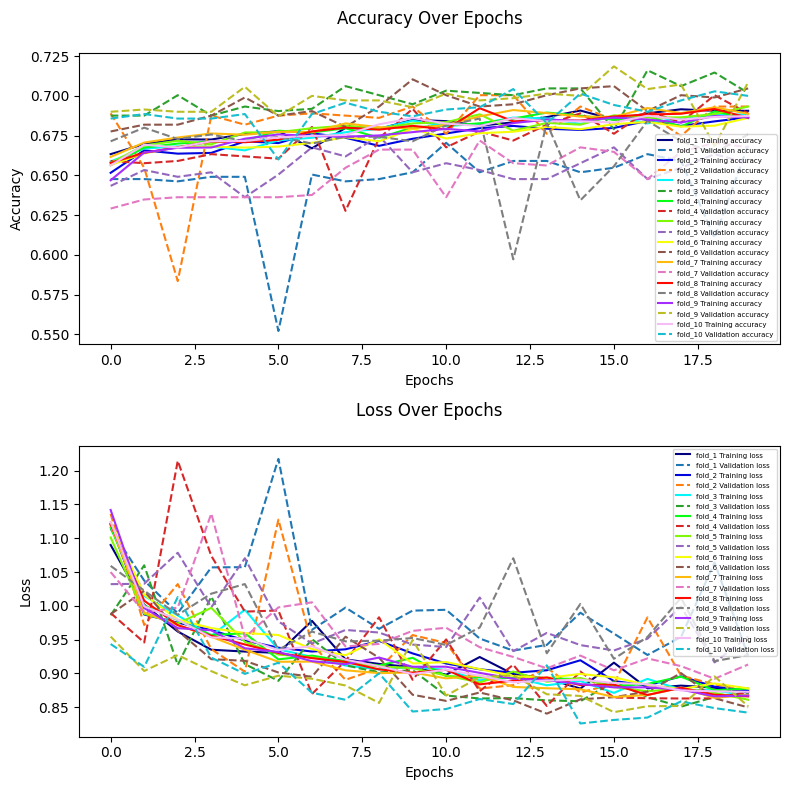

In [23]:
plot_results(mlp_exp1b_results)

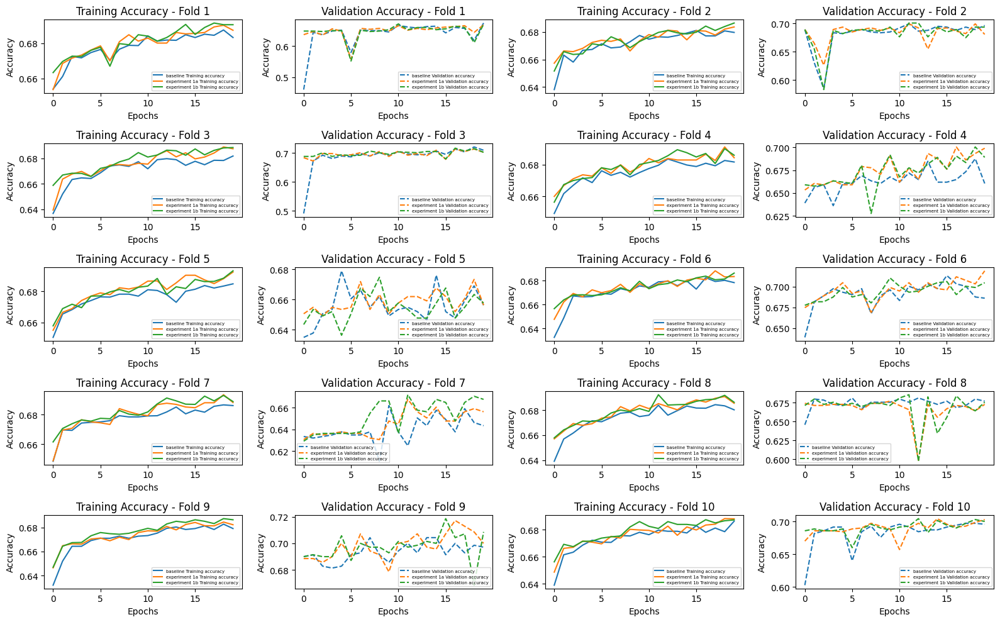

(2,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 1a  experiment 1a   0.686266  0.002903  0.685603  0.020744   
 experiment 1b  experiment 1b   0.687963  0.002268  0.686745  0.017028   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 1a  25.809294  0.020744  
 experiment 1b  22.624262  0.017028  )

In [24]:
compare_experiments(
    [mlp_baseline_results, mlp_exp1a_results, mlp_exp1b_results],
    ['baseline', 'experiment 1a', 'experiment 1b']
)

### Experiment 1c (2352->256->128->64->7)

In [25]:
mlp_exp1c_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 256, 'activation': 'relu'},
        {'type': 'dense', 'units': 128, 'activation': 'relu'},
        {'type': 'dense', 'units': 64, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 20,
    'callback': [callback]
}
mlp_exp1c_model = create_model(mlp_exp1c_config)
print(mlp_exp1c_model.summary())

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_99 (Dense)            (None, 256)               602368    
                                                                 
 dense_100 (Dense)           (None, 128)               32896     
                                                                 
 dense_101 (Dense)           (None, 64)                8256      
                                                                 
 dense_102 (Dense)           (None, 7)                 455       
                                                                 
Total params: 643975 (2.46 MB)
Trainable params: 643975 (2.46 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [26]:
mlp_exp1c_results = train_model(create_model, mlp_exp1c_config, x_train_flat, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


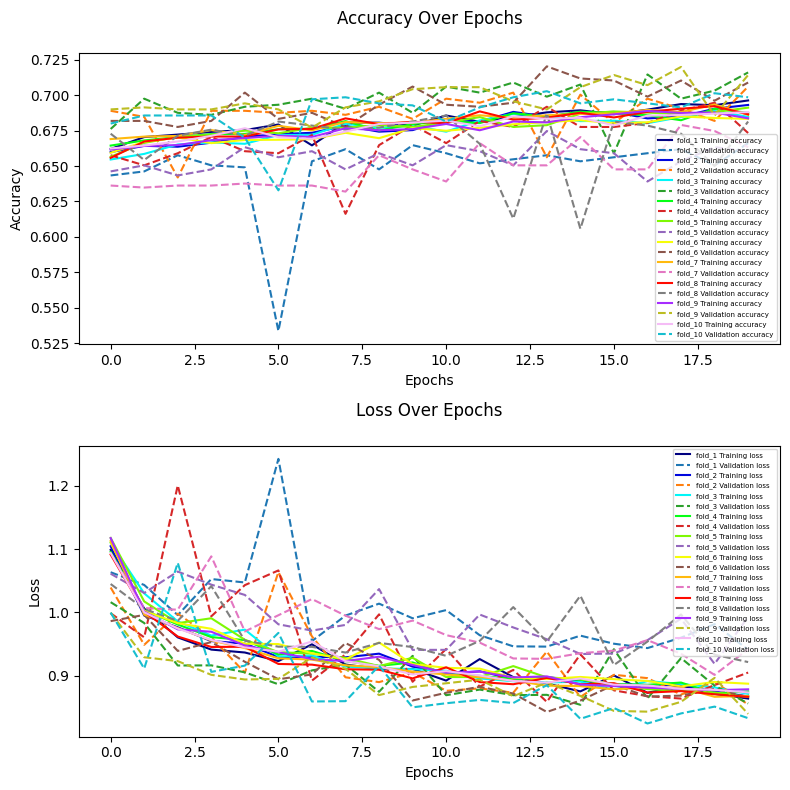

In [27]:
plot_results(mlp_exp1c_results)

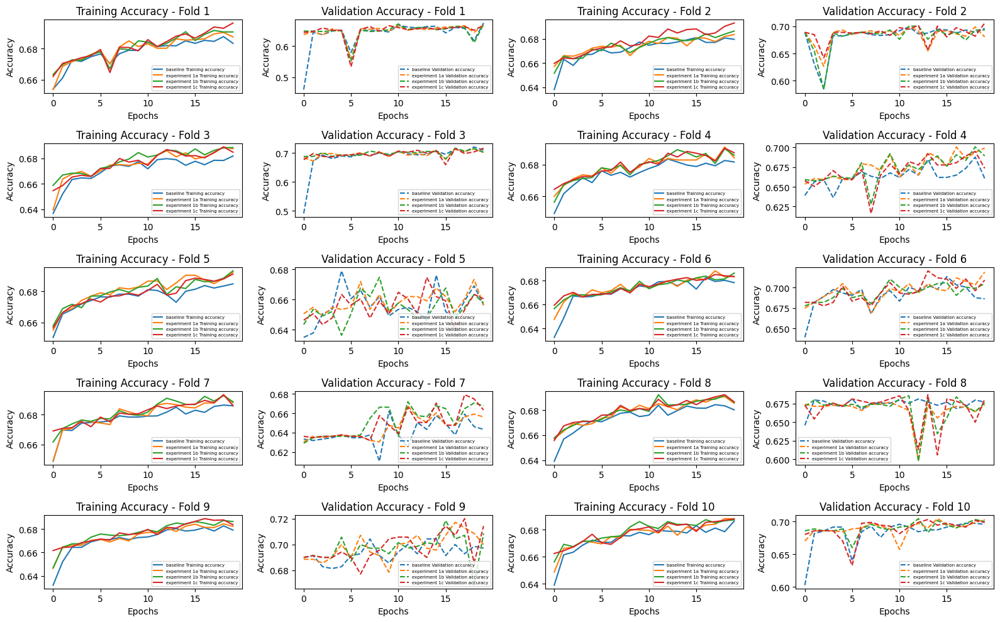

(3,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 1a  experiment 1a   0.686266  0.002903  0.685603  0.020744   
 experiment 1b  experiment 1b   0.687963  0.002268  0.686745  0.017028   
 experiment 1c  experiment 1c    0.68809  0.004037  0.688886  0.021105   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 1a  25.809294  0.020744  
 experiment 1b  22.624262  0.017028  
 experiment 1c  18.758181  0.021105  )

In [28]:
compare_experiments(
    [mlp_baseline_results, mlp_exp1a_results, mlp_exp1b_results, mlp_exp1c_results],
    ['baseline', 'experiment 1a', 'experiment 1b', 'experiment 1c']
)

### Experiment 2a (Increase batch size)

In [29]:
mlp_exp2a_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 512, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 64,
    'epochs': 20,
}
mlp_exp2a_model = create_model(mlp_exp2a_config)
print(mlp_exp2a_model.summary())

Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_143 (Dense)           (None, 512)               1204736   
                                                                 
 dense_144 (Dense)           (None, 7)                 3591      
                                                                 
Total params: 1208327 (4.61 MB)
Trainable params: 1208327 (4.61 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [30]:
mlp_exp2a_results = train_model(create_model, mlp_exp2a_config, x_train_flat, y_train, num_folds=10)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


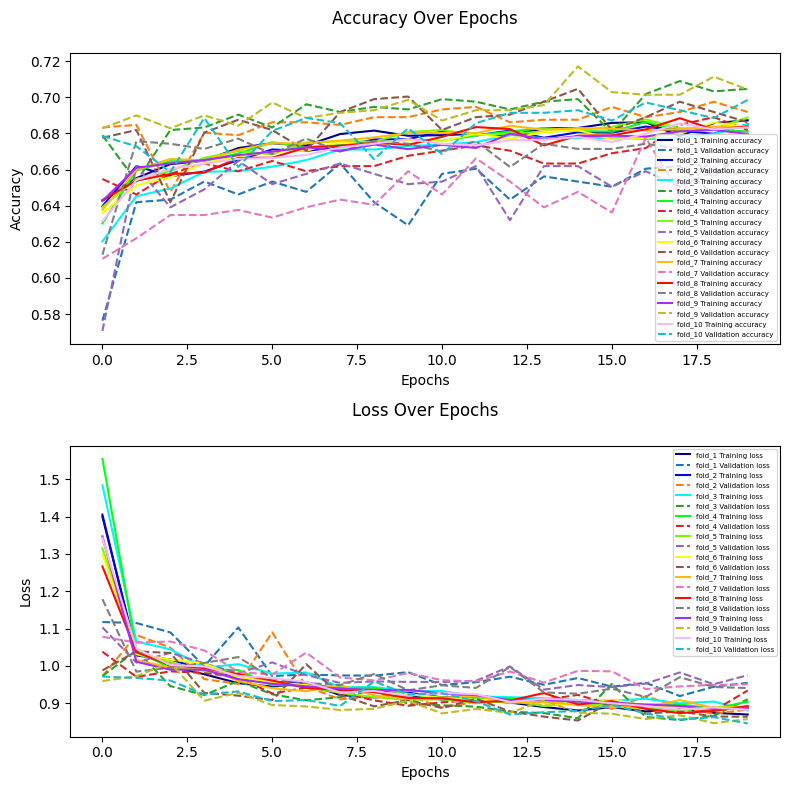

In [31]:
plot_results(mlp_exp2a_results)

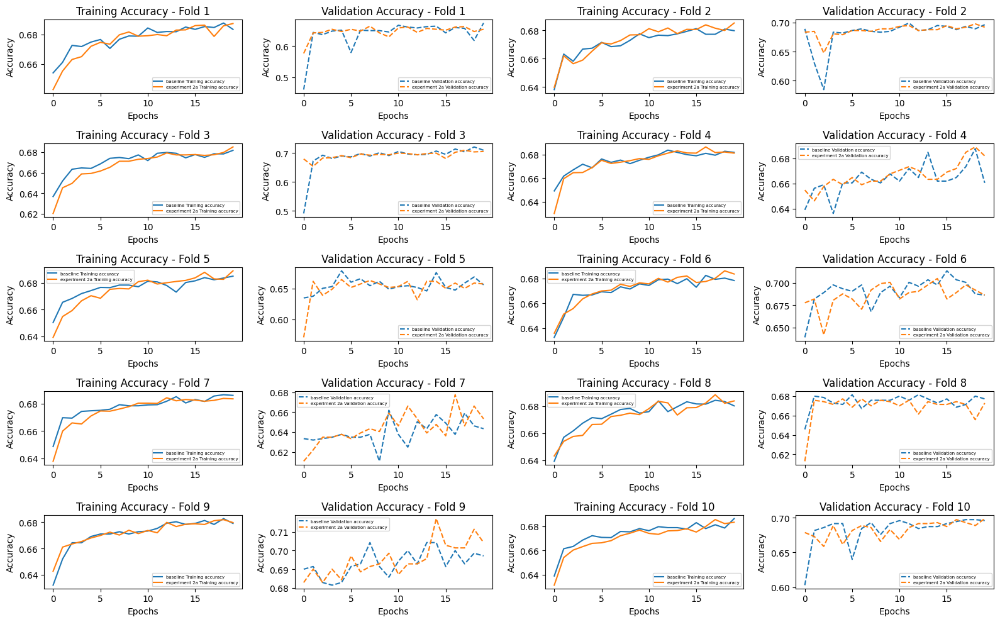

(1,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 2a  experiment 2a   0.684125  0.002535  0.680467  0.019227   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 2a   8.909319  0.019227  )

In [32]:
compare_experiments(
    [mlp_baseline_results, mlp_exp2a_results],
    ['baseline', 'experiment 2a']
)

### Experiment 2b (Increase number of epochs)

In [33]:
mlp_exp2b_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 512, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 50,
    'callback': callback
}
mlp_exp2b_model = create_model(mlp_exp2b_config)
print(mlp_exp2b_model.summary())

Model: "sequential_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_165 (Dense)           (None, 512)               1204736   
                                                                 
 dense_166 (Dense)           (None, 7)                 3591      
                                                                 
Total params: 1208327 (4.61 MB)
Trainable params: 1208327 (4.61 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [34]:
mlp_exp2b_results = train_model(create_model, mlp_exp2b_config, x_train_flat, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


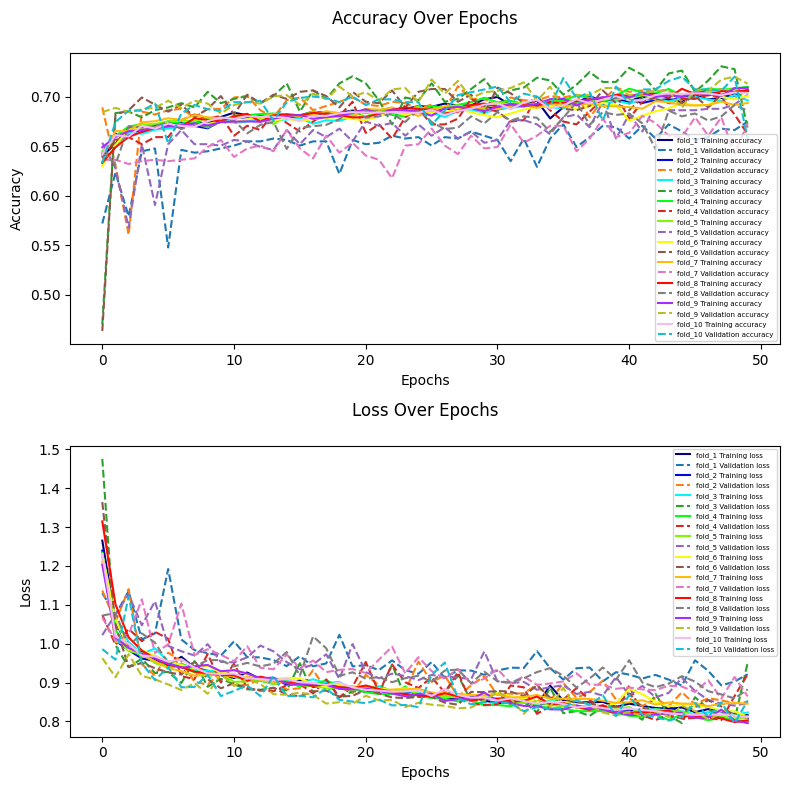

In [35]:
plot_results(mlp_exp2b_results)

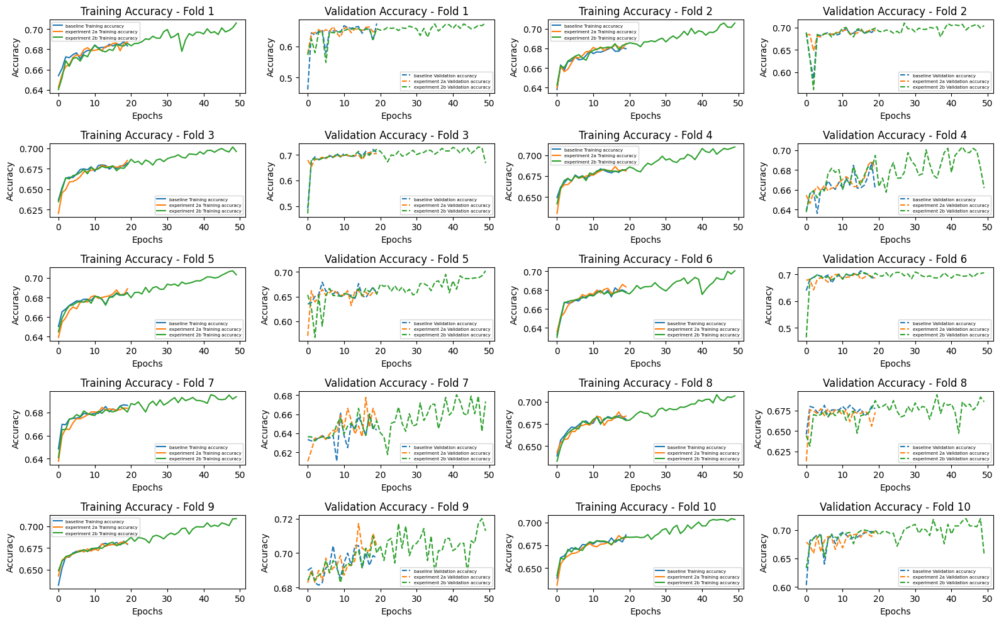

(2,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 2a  experiment 2a   0.684125  0.002535  0.680467  0.019227   
 experiment 2b  experiment 2b   0.703312  0.005031  0.684601  0.019356   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 2a   8.909319  0.019227  
 experiment 2b  39.752059  0.019356  )

In [36]:
compare_experiments(
    [mlp_baseline_results, mlp_exp2a_results, mlp_exp2b_results],
    ['baseline', 'experiment 2a', 'experiment 2b']
)

### Experiment 2c (Reduce learning on plateau)

In [37]:
from tensorflow.keras.callbacks import ReduceLROnPlateau


reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,          # Factor by which the learning rate will be reduced
    patience=5,          # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=0.00001       # Lower bound on the learning rate
)


mlp_exp2c_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 512, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 50,
    'callback': [callback, reduce_lr]
}

mlp_exp2c_model = create_model(mlp_exp2c_config)
print(mlp_exp2c_model.summary())

Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_187 (Dense)           (None, 512)               1204736   
                                                                 
 dense_188 (Dense)           (None, 7)                 3591      
                                                                 
Total params: 1208327 (4.61 MB)
Trainable params: 1208327 (4.61 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [38]:
mlp_exp2c_results = train_model(create_model, mlp_exp2c_config, x_train_flat, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


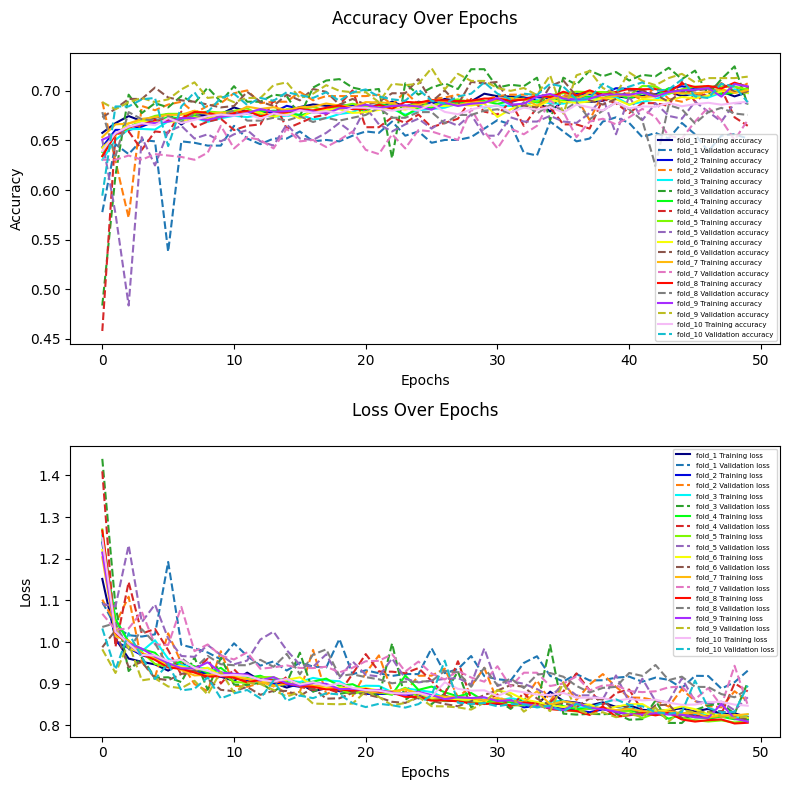

In [39]:
plot_results(mlp_exp2c_results)

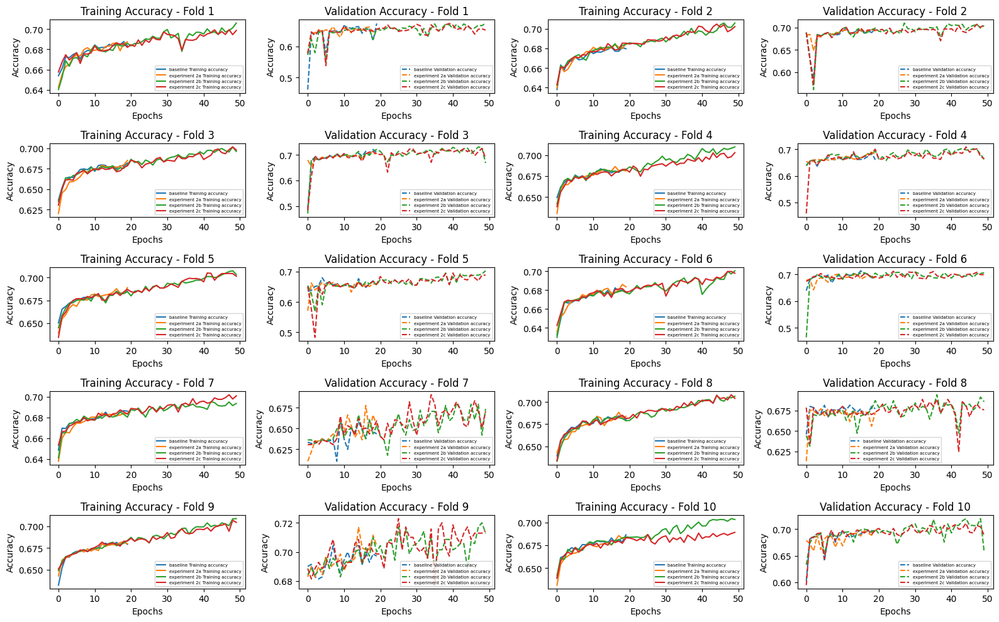

(3,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 2a  experiment 2a   0.684125  0.002535  0.680467  0.019227   
 experiment 2b  experiment 2b   0.703312  0.005031  0.684601  0.019356   
 experiment 2c  experiment 2c   0.699919   0.00429  0.684605  0.018392   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 2a   8.909319  0.019227  
 experiment 2b  39.752059  0.019356  
 experiment 2c  37.592688  0.018392  )

In [40]:
compare_experiments(
    [mlp_baseline_results, mlp_exp2a_results, mlp_exp2b_results, mlp_exp2c_results],
    ['baseline', 'experiment 2a', 'experiment 2b', 'experiment 2c']
)

### Expreriment 3a (data augmentation)

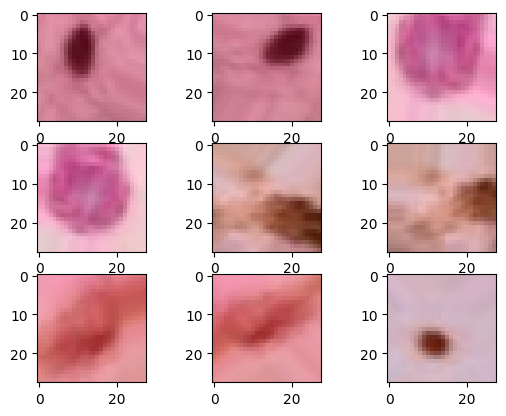

In [41]:
from keras.preprocessing.image import ImageDataGenerator

num_samples = x_train.shape[0]
num_augmented_images_per_sample = 2

datagen = ImageDataGenerator(
    rotation_range=40,       # Randomly rotate images in between -40 and 40
    width_shift_range=0.2,   # Randomly shift images horizontally (fraction of total width)
    height_shift_range=0.2,  # Randomly shift images vertically (fraction of total height)
    shear_range=0.2,         # Randomly shear images
    zoom_range=0.2,          # Randomly zoom in on images
    horizontal_flip=True,    # Randomly flip images horizontally
    fill_mode='nearest'      # Fill in new pixels with the nearest surrounding pixel values
)
augmented_images = np.zeros((num_samples * num_augmented_images_per_sample, 28, 28, 3))

# Generate augmented images for each image in x_train
index = 0
for i, img in enumerate(x_train):
    img = img.reshape((1,) + img.shape)
    # Create an iterator to generate augmented images
    augmented_iterator = datagen.flow(img, batch_size=1)
    for j in range(num_augmented_images_per_sample):
        augmented_img = next(augmented_iterator)[0]
        augmented_images[index] = augmented_img
        index += 1

for i in range(9):
 plt.subplot(330 + 1 + i)
 plt.imshow(augmented_images[i])
plt.show()

In [42]:
x_train_extra = np.concatenate((x_train, augmented_images))
y_train_extra = np.repeat(y_train, num_augmented_images_per_sample+1, axis=0)

shuffled_indices = np.random.permutation(num_samples)
x_train_extra = x_train_extra[shuffled_indices]
y_train_extra = y_train_extra[shuffled_indices]

x_train_extra_flat = x_train_extra.reshape((-1, input_shape))

In [43]:
mlp_exp3a_results = train_model(create_model, mlp_baseline_config, x_train_extra_flat, y_train_extra)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


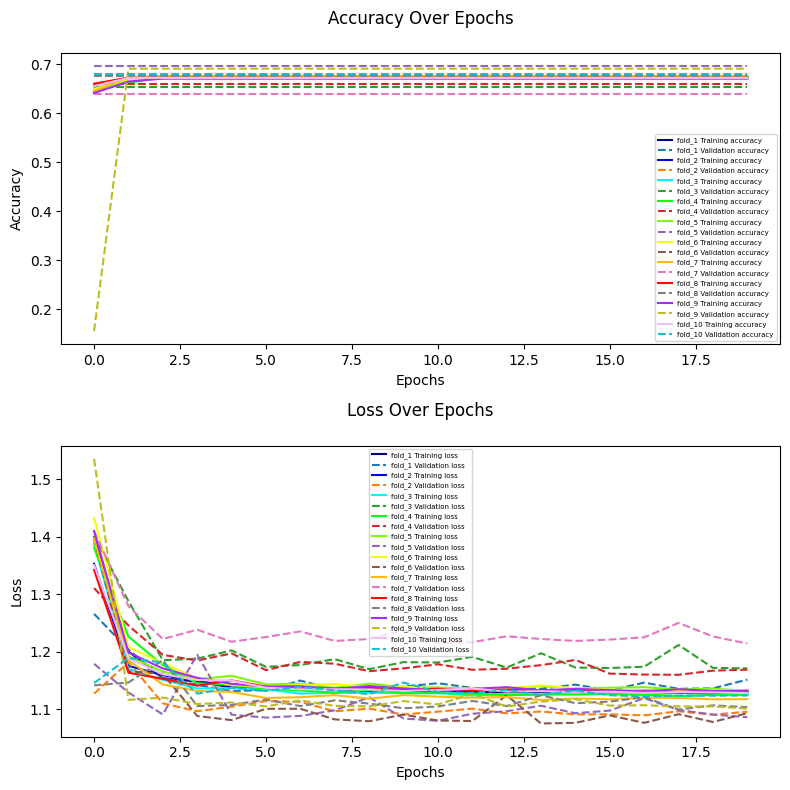

In [44]:
plot_results(mlp_exp3a_results)

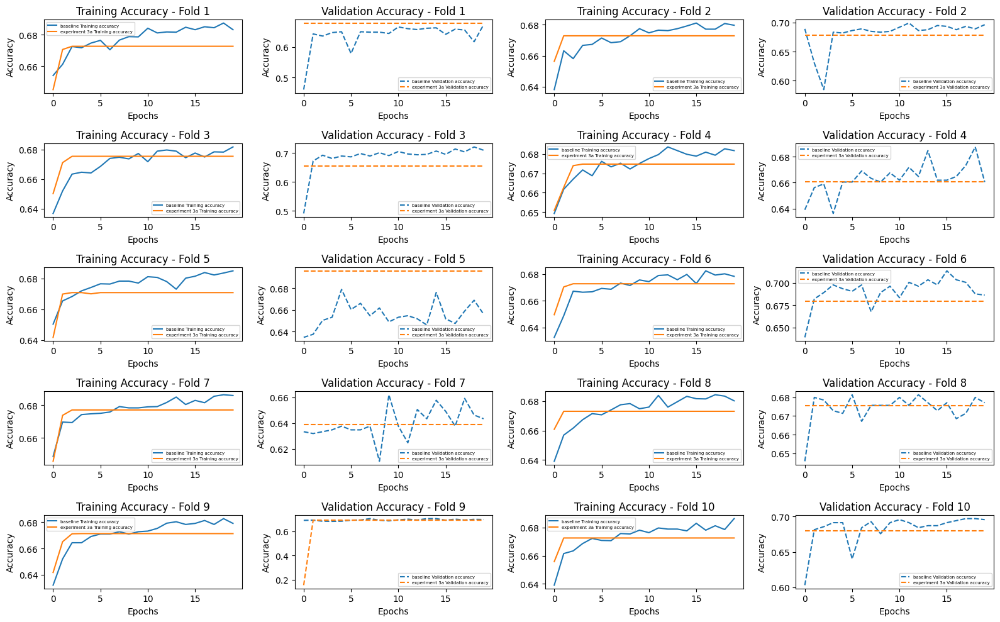

(0,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 3a  experiment 3a   0.673327  0.001814  0.673331   0.01632   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 3a  18.022268   0.01632  )

In [45]:
compare_experiments(
    [mlp_baseline_results, mlp_exp3a_results],
    ['baseline', 'experiment 3a']
)

### Expirement 3b (Data Augmentation with SMOTE)

In [46]:
# Define which class to undersample
undersample_strategy = {5: 800}  # Change the class index and target number of samples as needed

# Create a RandomUnderSampler instance with the specified strategy
undersampler = RandomUnderSampler(sampling_strategy=undersample_strategy)

# Apply the undersampler to the 2D data
x_train_undersampled_2d, y_train_undersampled = undersampler.fit_resample(x_train_flat, y_train)

# Define which classes to oversample
oversample_strategy = {0: 800, 1: 800, 2: 800, 4: 800, 6: 800}

# Create a SMOTE instance with the specified sampling strategy
smote = SMOTE(sampling_strategy=oversample_strategy)

# Apply SMOTE to the undersampled 2D data
x_train_res_2d, y_train_res = smote.fit_resample(x_train_undersampled_2d, y_train_undersampled)

In [47]:
mlp_exp_3b_results = train_model(create_model, mlp_baseline_config, x_train_res_2d, y_train_res)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


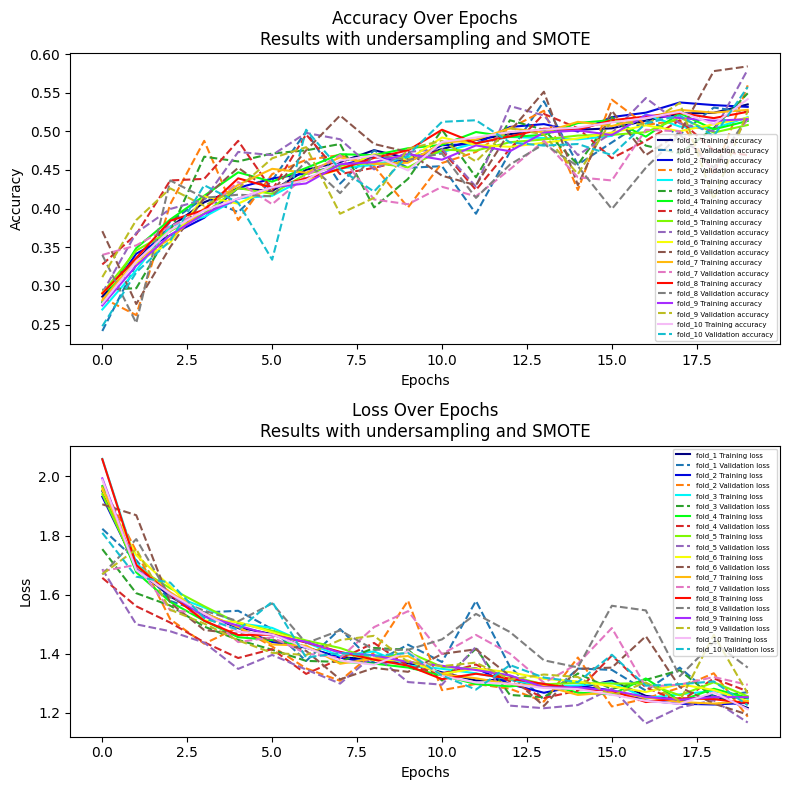

In [48]:
plot_results(mlp_exp_3b_results, "Results with undersampling and SMOTE")

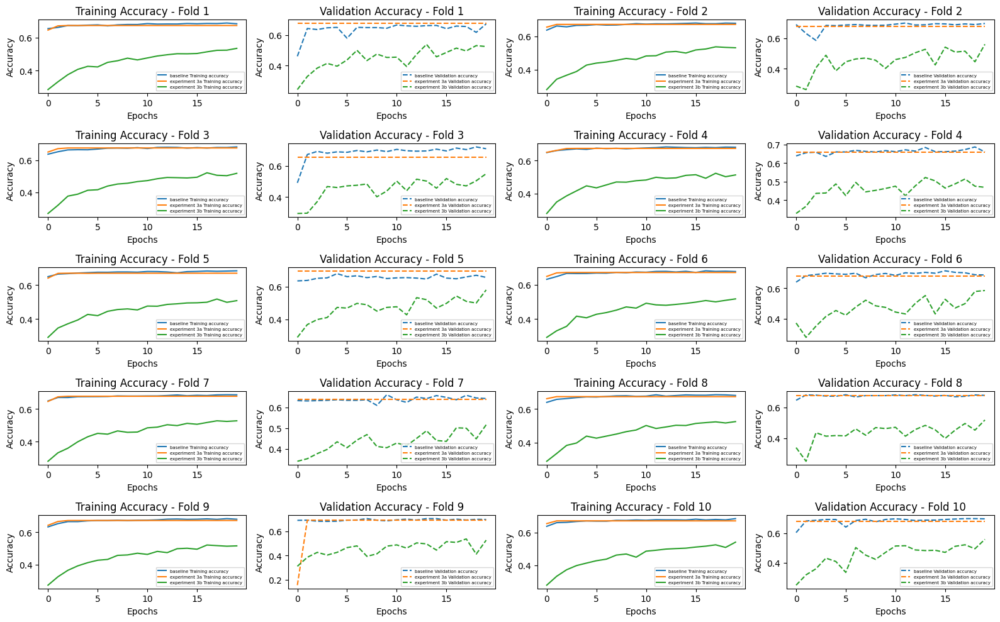

(0,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 3a  experiment 3a   0.673327  0.001814  0.673331   0.01632   
 experiment 3b  experiment 3b   0.523429   0.01003  0.538525  0.032733   
 
                time_mean  time_std  
 baseline       22.604787  0.020047  
 experiment 3a  18.022268   0.01632  
 experiment 3b  11.440877  0.032733  )

In [49]:
compare_experiments(
    [mlp_baseline_results, mlp_exp3a_results, mlp_exp_3b_results],
    ['baseline', 'experiment 3a', 'experiment 3b']
)

### Best experiments combined (1c+2c)

In [54]:
mlp_comb_config = {
    'layers': [
        {'type': 'input', 'shape': (x_train_flat.shape[1], )},
        {'type': 'dense', 'units': 256, 'activation': 'relu'},
        {'type': 'dense', 'units': 128, 'activation': 'relu'},
        {'type': 'dense', 'units': 64, 'activation': 'relu'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {'type': tf.keras.optimizers.Adam, 'learning_rate': 0.001},
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 50,
    'callback': [callback, reduce_lr]
}
mlp_comb_model = create_model(mlp_comb_config)
print(mlp_comb_model.summary())

Model: "sequential_103"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_273 (Dense)           (None, 256)               602368    
                                                                 
 dense_274 (Dense)           (None, 128)               32896     
                                                                 
 dense_275 (Dense)           (None, 64)                8256      
                                                                 
 dense_276 (Dense)           (None, 7)                 455       
                                                                 
Total params: 643975 (2.46 MB)
Trainable params: 643975 (2.46 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [55]:
mlp_comb_results = train_model(create_model, mlp_comb_config, x_train_flat, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


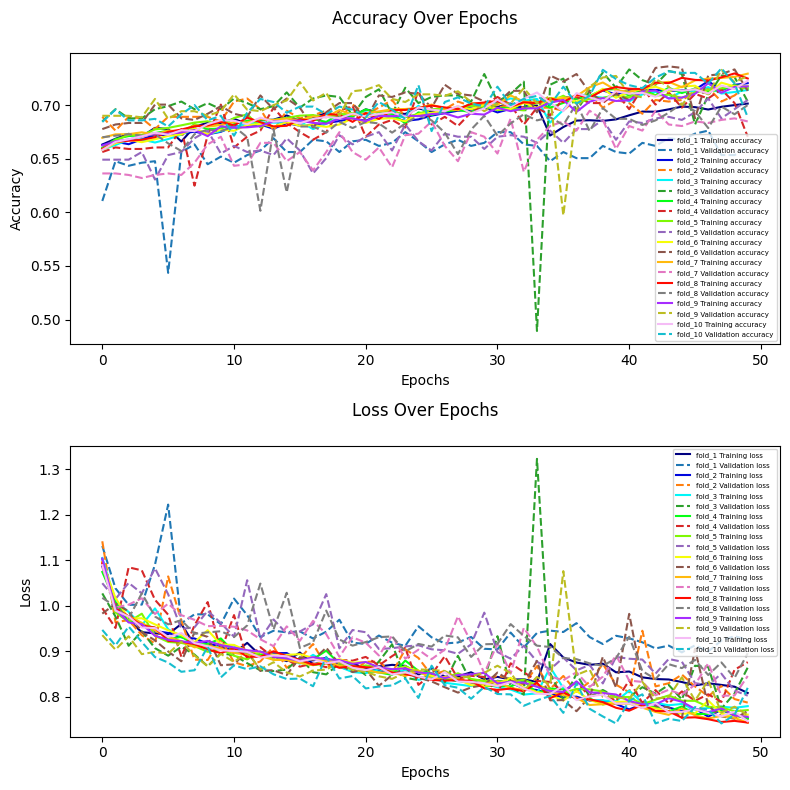

In [56]:
plot_results(mlp_comb_results)

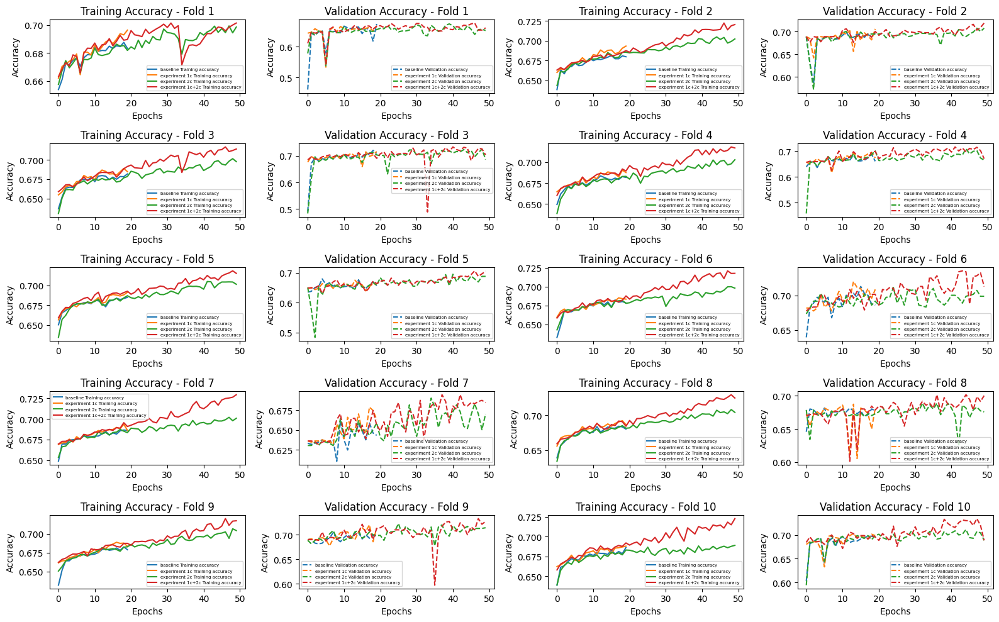

(3,
                               name train_mean train_std  val_mean   val_std  \
 baseline                  baseline   0.682127   0.00277  0.679468  0.020047   
 experiment 1c        experiment 1c    0.68809  0.004037  0.688886  0.021105   
 experiment 2c        experiment 2c   0.699919   0.00429  0.684605  0.018392   
 experiment 1c+2c  experiment 1c+2c   0.717996  0.007082  0.697163  0.020055   
 
                   time_mean  time_std  
 baseline          22.604787  0.020047  
 experiment 1c     18.758181  0.021105  
 experiment 2c     37.592688  0.018392  
 experiment 1c+2c   40.38403  0.020055  )

In [57]:
compare_experiments(
    [mlp_baseline_results, mlp_exp1c_results, mlp_exp2c_results, mlp_comb_results],
    ['baseline', 'experiment 1c', 'experiment 2c', 'experiment 1c+2c']
)

## Build CNN model

### Baseline model

In [58]:
cnn_baseline_config = {
    'layers': [
        {'type': 'input', 'shape': x_train.shape[1:]},
        {'type': 'conv2d', 'filters': 16, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'flatten'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {
        'type': keras.optimizers.Adam,
        'learning_rate': 0.001
    },
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 20
}

cnn_baseline = create_model(cnn_baseline_config)
cnn_baseline.summary()

Model: "sequential_114"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 16)        0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 2704)              0         
                                                                 
 dense_317 (Dense)           (None, 7)                 18935     
                                                                 
Total params: 19383 (75.71 KB)
Trainable params: 19383 (75.71 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [59]:
cnn_baseline_results = train_model(create_model, cnn_baseline_config, x_train, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


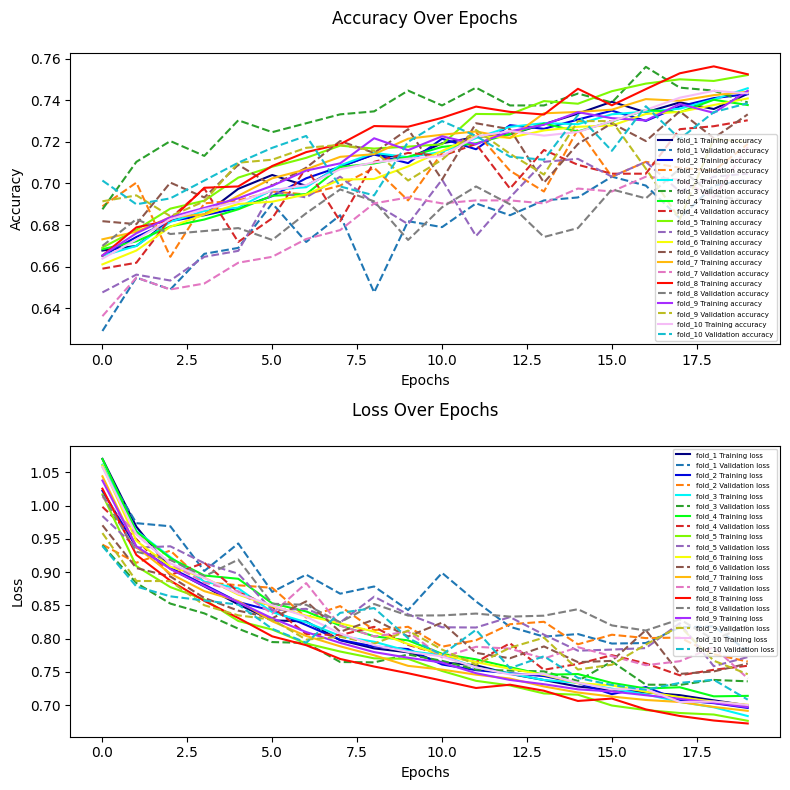

In [60]:
plot_results(cnn_baseline_results)

### Experiment 1a


In [61]:
callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

cnn_deep_config = {
    'layers': [
        {'type': 'input', 'shape': x_train.shape[1:]},
        {'type': 'conv2d', 'filters': 16, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'conv2d', 'filters': 32, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'flatten'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {
        'type': keras.optimizers.Adam,
        'learning_rate': 0.001
    },
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32, # default,
    'epochs': 20,
    'callback': callback
}


cnn_deep_model = create_model(cnn_deep_config)
print(cnn_deep_model.summary())

Model: "sequential_125"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 26, 26, 16)        448       
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 13, 13, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_12 (Conv2D)          (None, 11, 11, 32)        4640      
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 5, 5, 32)          0         
 ng2D)                                                           
                                                                 
 flatten_11 (Flatten)        (None, 800)               0         
                                                                 
 dense_328 (Dense)           (None, 7)              

In [62]:
cnn_deep_results = train_model(create_model, cnn_deep_config, x_train, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


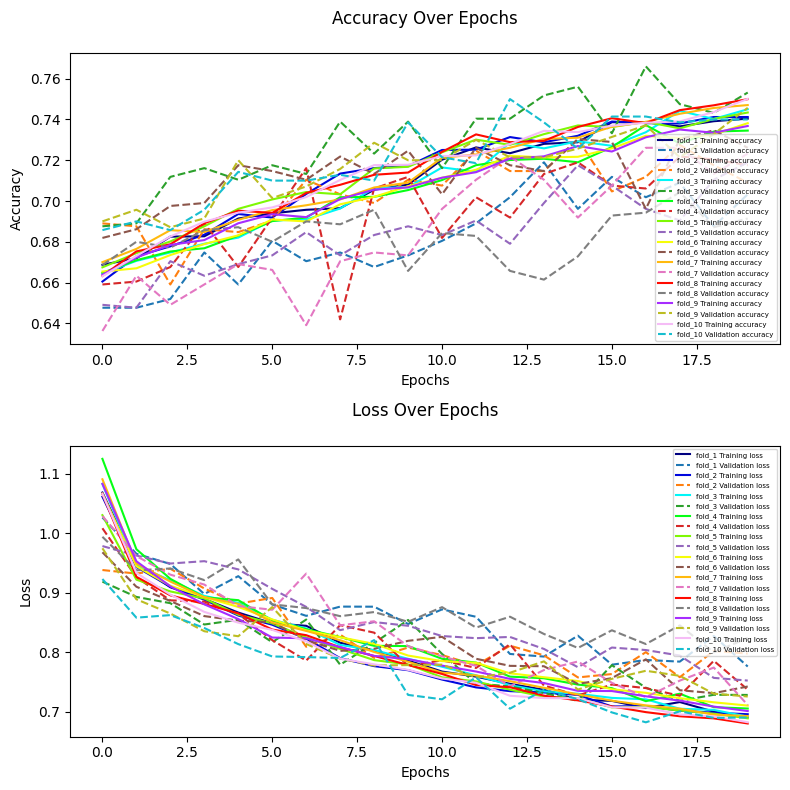

In [63]:
plot_results(cnn_deep_results)

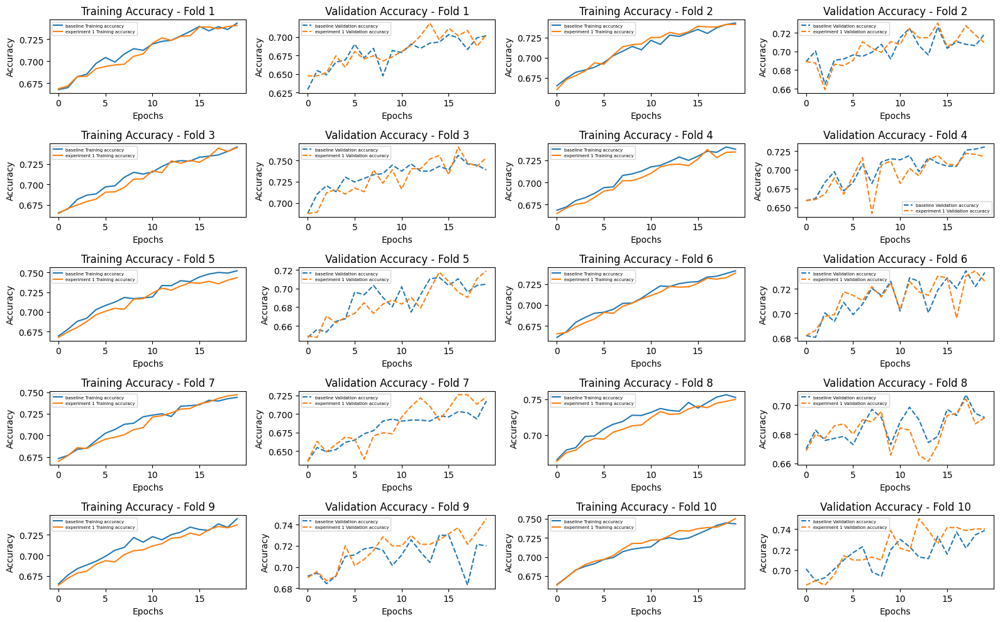

(1,
                       name train_mean train_std  val_mean   val_std  \
 baseline          baseline     0.7447  0.004346  0.719565    0.0154   
 experiment 1  experiment 1    0.74267  0.005118   0.72285  0.018317   
 
               time_mean  time_std  
 baseline      16.416139    0.0154  
 experiment 1  17.025611  0.018317  )

In [64]:
compare_experiments([cnn_baseline_results, cnn_deep_results], ['baseline', 'experiment 1'])

### Experiment 1b

In [65]:
cnn_deep_config2 = {
    'layers': [
        {'type': 'input', 'shape': x_train.shape[1:]},
        {'type': 'conv2d', 'filters': 16, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'conv2d', 'filters': 32, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'conv2d', 'filters': 64, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'flatten'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {
        'type': keras.optimizers.Adam,
        'learning_rate': 0.001
    },
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32, # default,
    'epochs': 20,
    'callback': callback
}

cnn_deep_model2 = create_model(cnn_deep_config2)
print(cnn_deep_model2.summary())

Model: "sequential_136"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 26, 26, 16)        448       
                                                                 
 max_pooling2d_33 (MaxPooli  (None, 13, 13, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_34 (Conv2D)          (None, 11, 11, 32)        4640      
                                                                 
 max_pooling2d_34 (MaxPooli  (None, 5, 5, 32)          0         
 ng2D)                                                           
                                                                 
 conv2d_35 (Conv2D)          (None, 3, 3, 64)          18496     
                                                                 
 max_pooling2d_35 (MaxPooli  (None, 1, 1, 64)       

In [66]:
cnn_deep_results2 = train_model(create_model, cnn_deep_config2, x_train, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


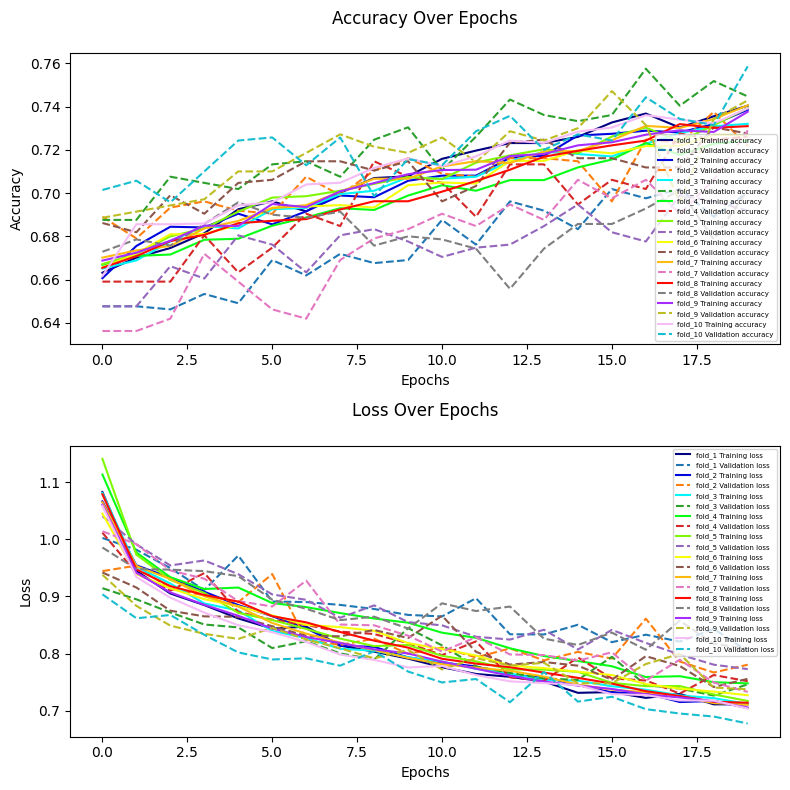

In [67]:
plot_results(cnn_deep_results2)

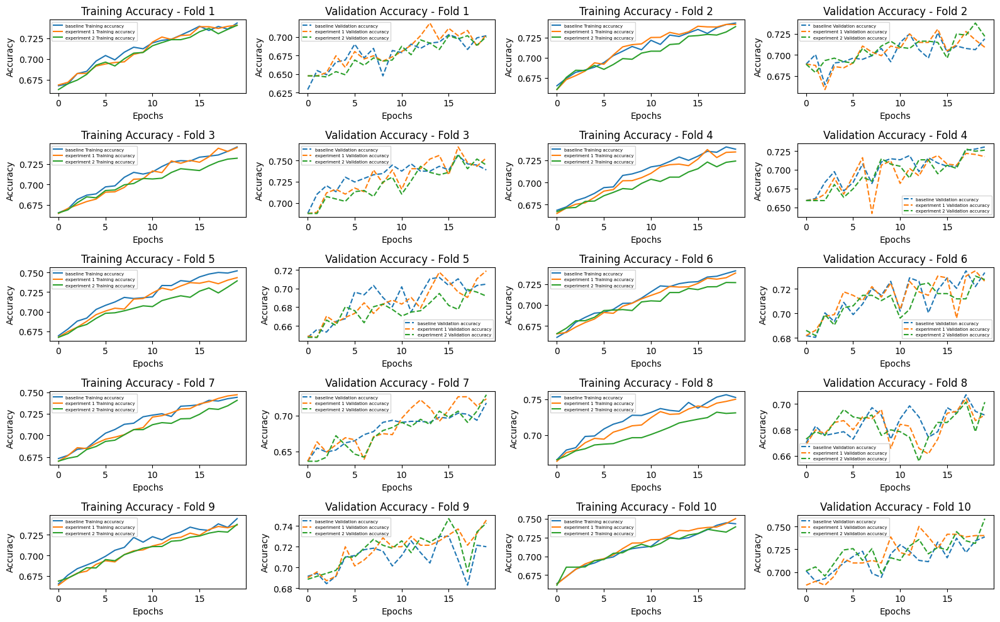

(2,
                       name train_mean train_std  val_mean   val_std  \
 baseline          baseline     0.7447  0.004346  0.719565    0.0154   
 experiment 1  experiment 1    0.74267  0.005118   0.72285  0.018317   
 experiment 2  experiment 2   0.734948  0.005695  0.724423  0.020296   
 
               time_mean  time_std  
 baseline      16.416139    0.0154  
 experiment 1  17.025611  0.018317  
 experiment 2  20.476492  0.020296  )

In [68]:
compare_experiments([cnn_baseline_results, cnn_deep_results, cnn_deep_results2],
                    ['baseline', 'experiment 1', 'experiment 2'])

### Experiment 2a

In [69]:
exp2a_config_cnn = {
    'layers': [
        {'type': 'input', 'shape': x_train.shape[1:]},
        {'type': 'conv2d', 'filters': 16, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'flatten'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {
        'type': keras.optimizers.Adam,
        'learning_rate': 0.001
    },
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 64,
    'epochs': 20,
    'callback': callback
}

exp2a_cnn_model = create_model(exp2a_config_cnn)
exp2a_cnn_model.summary()

Model: "sequential_147"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 26, 26, 16)        448       
                                                                 
 max_pooling2d_66 (MaxPooli  (None, 13, 13, 16)        0         
 ng2D)                                                           
                                                                 
 flatten_33 (Flatten)        (None, 2704)              0         
                                                                 
 dense_350 (Dense)           (None, 7)                 18935     
                                                                 
Total params: 19383 (75.71 KB)
Trainable params: 19383 (75.71 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [70]:
cnn_exp2a_results = train_model(create_model, exp2a_config_cnn, x_train, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


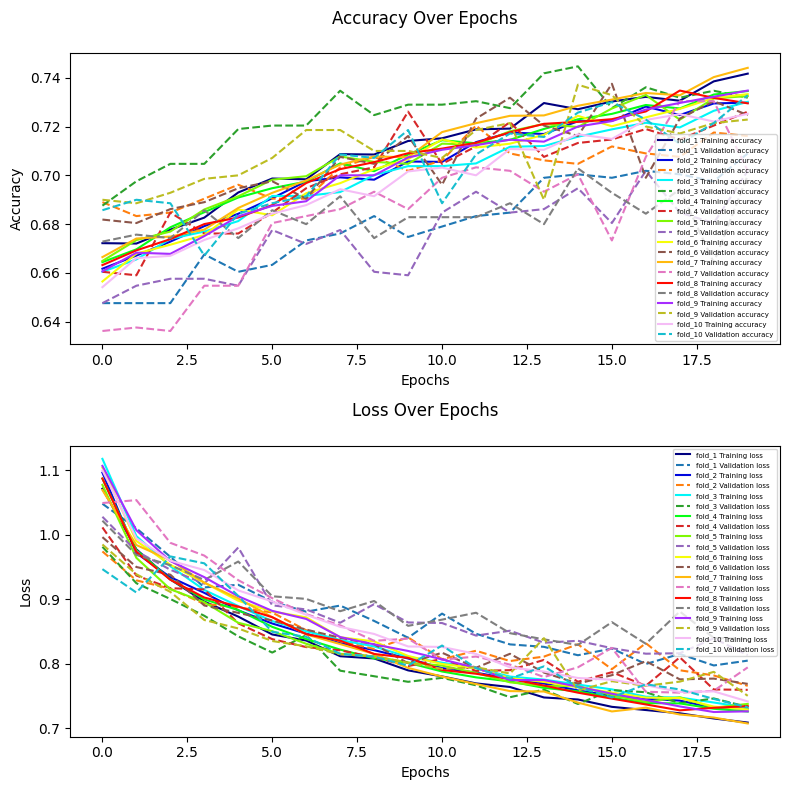

In [71]:
plot_results(cnn_exp2a_results)

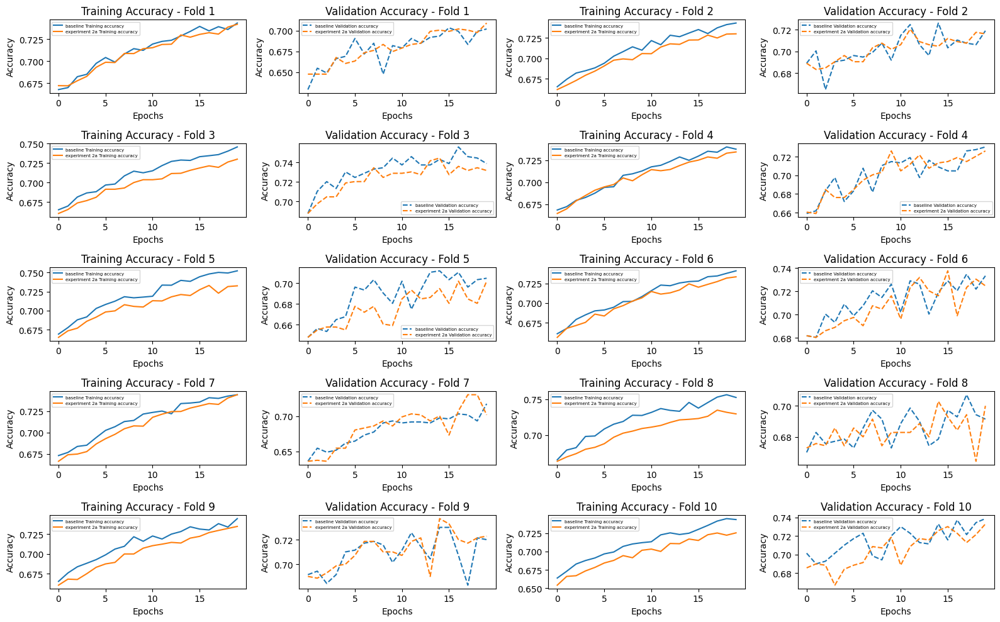

(0,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline     0.7447  0.004346  0.719565    0.0154   
 experiment 2a  experiment 2a   0.733536  0.005401  0.716713  0.012079   
 
                time_mean  time_std  
 baseline       16.416139    0.0154  
 experiment 2a   9.565337  0.012079  )

In [72]:
compare_experiments([cnn_baseline_results, cnn_exp2a_results], ['baseline', 'experiment 2a'])

### Experiment 2b

In [73]:
exp2b_config_cnn = {
    'layers': [
        {'type': 'input', 'shape': x_train.shape[1:]},
        {'type': 'conv2d', 'filters': 16, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'dropout', 'rate': 0.1},
        {'type': 'flatten'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {
        'type': keras.optimizers.Adam,
        'learning_rate': 0.001
    },
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 50,
    'callback': [callback]
}

exp2b_cnn_model = create_model(exp2b_config_cnn)
exp2b_cnn_model.summary()

Model: "sequential_158"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_77 (Conv2D)          (None, 26, 26, 16)        448       
                                                                 
 max_pooling2d_77 (MaxPooli  (None, 13, 13, 16)        0         
 ng2D)                                                           
                                                                 
 dropout (Dropout)           (None, 13, 13, 16)        0         
                                                                 
 flatten_44 (Flatten)        (None, 2704)              0         
                                                                 
 dense_361 (Dense)           (None, 7)                 18935     
                                                                 
Total params: 19383 (75.71 KB)
Trainable params: 19383 (75.71 KB)
Non-trainable params: 0 (0.00 Byte)
________________

In [74]:
cnn_exp2b_results = train_model(create_model, exp2b_config_cnn, x_train, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


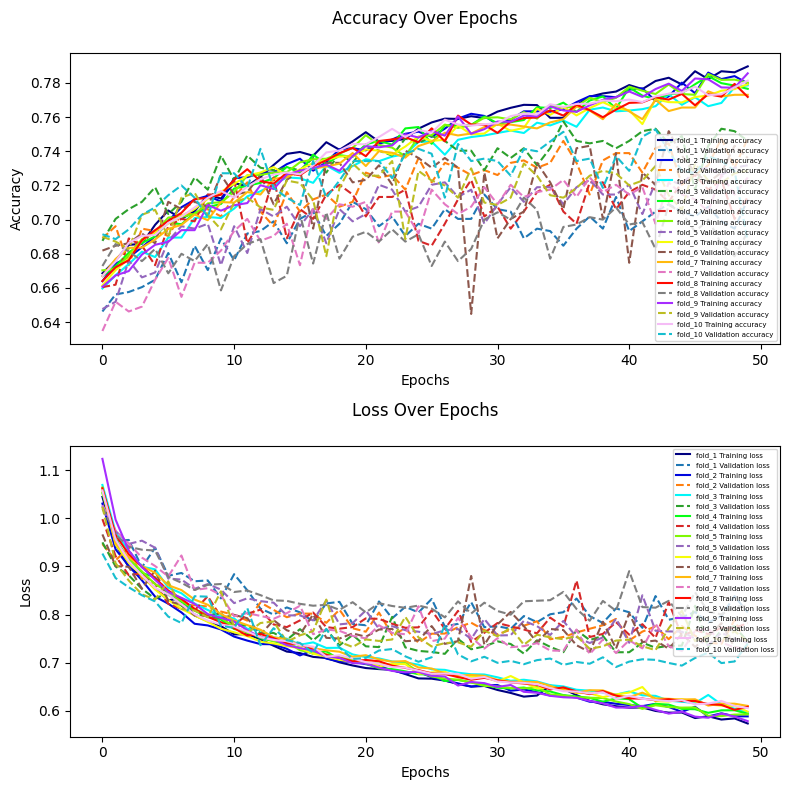

In [75]:
plot_results(cnn_exp2b_results)

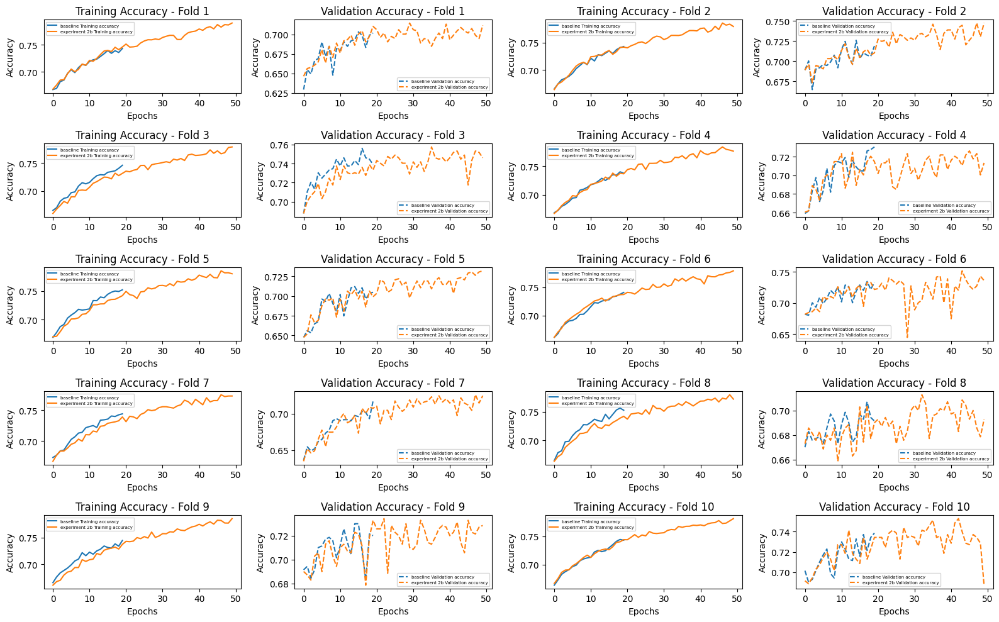

(1,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline     0.7447  0.004346  0.719565    0.0154   
 experiment 2b  experiment 2b   0.779601  0.005055  0.721984  0.019543   
 
                time_mean  time_std  
 baseline       16.416139    0.0154  
 experiment 2b  36.267104  0.019543  )

In [76]:
compare_experiments([cnn_baseline_results, cnn_exp2b_results], ['baseline', 'experiment 2b'])

### Expreriment 3a


In [77]:
exp3a_cnn_results = train_model(create_model, cnn_baseline_config, x_train_extra, y_train_extra)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


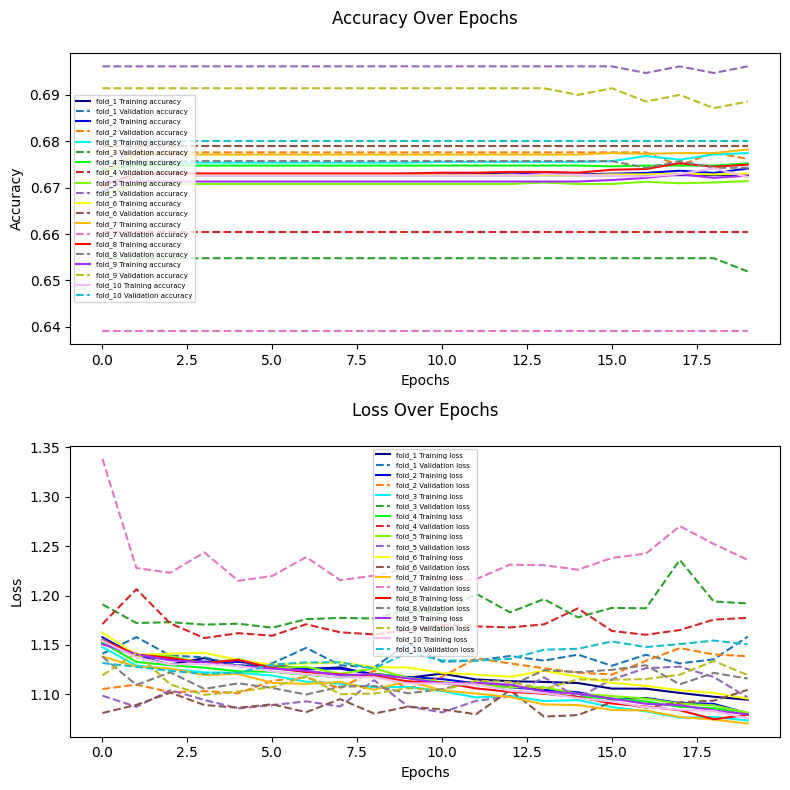

In [78]:
plot_results(exp3a_cnn_results)

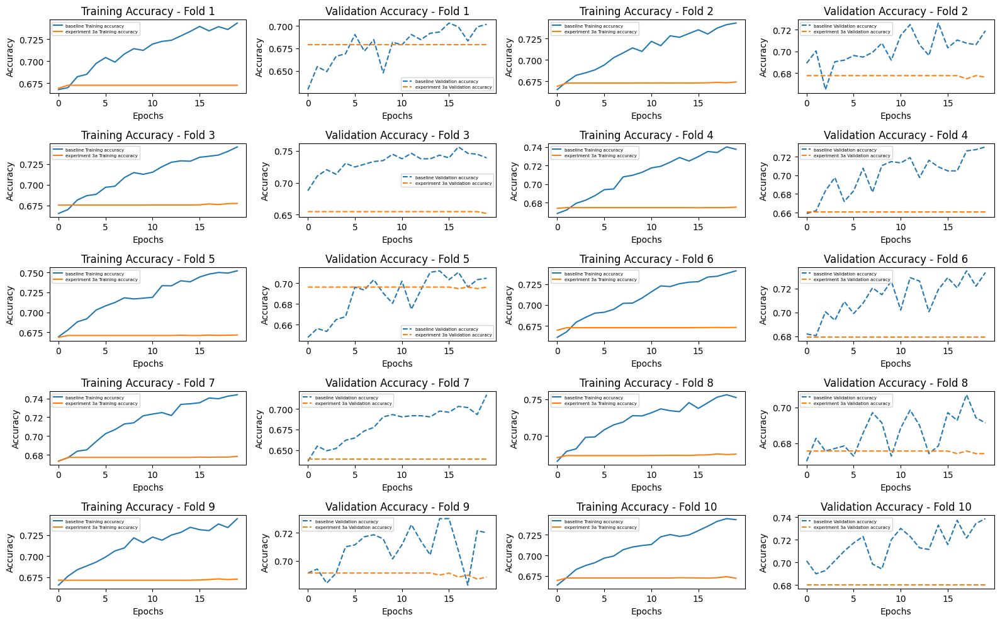

(0,
                         name train_mean train_std  val_mean   val_std  \
 baseline            baseline     0.7447  0.004346  0.719565    0.0154   
 experiment 3a  experiment 3a   0.674199  0.002151  0.672474  0.016309   
 
                time_mean  time_std  
 baseline       16.416139    0.0154  
 experiment 3a  15.518622  0.016309  )

In [80]:
compare_experiments([cnn_baseline_results, exp3a_cnn_results], ['baseline', 'experiment 3a'])

### Best experiments combined (1b+2b)

In [81]:
callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

cnn_combined_config = {
    'layers': [
        {'type': 'input', 'shape': x_train.shape[1:]},
        {'type': 'conv2d', 'filters': 16, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'dropout', 'rate': 0.1},
        {'type': 'conv2d', 'filters': 32, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'dropout', 'rate': 0.1},
        {'type': 'conv2d', 'filters': 64, 'kernel_size': (3, 3), 'activation': 'relu'},
        {'type': 'max_pooling2d', 'pool_size': (2, 2)},
        {'type': 'dropout', 'rate': 0.1},
        {'type': 'flatten'},
        {'type': 'dense', 'units': num_classes, 'activation': 'softmax'}
    ],
    'optimizer': {
        'type': keras.optimizers.Adam,
        'learning_rate': 0.001
    },
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32, # default,
    'epochs': 50,
    'callback': callback
}

cnn_combined_model = create_model(cnn_combined_config)
print(cnn_combined_model.summary())

Model: "sequential_179"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_98 (Conv2D)          (None, 26, 26, 16)        448       
                                                                 
 max_pooling2d_98 (MaxPooli  (None, 13, 13, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_11 (Dropout)        (None, 13, 13, 16)        0         
                                                                 
 conv2d_99 (Conv2D)          (None, 11, 11, 32)        4640      
                                                                 
 max_pooling2d_99 (MaxPooli  (None, 5, 5, 32)          0         
 ng2D)                                                           
                                                                 
 dropout_12 (Dropout)        (None, 5, 5, 32)       

In [82]:
cnn_combined_results = train_model(create_model, cnn_combined_config, x_train, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


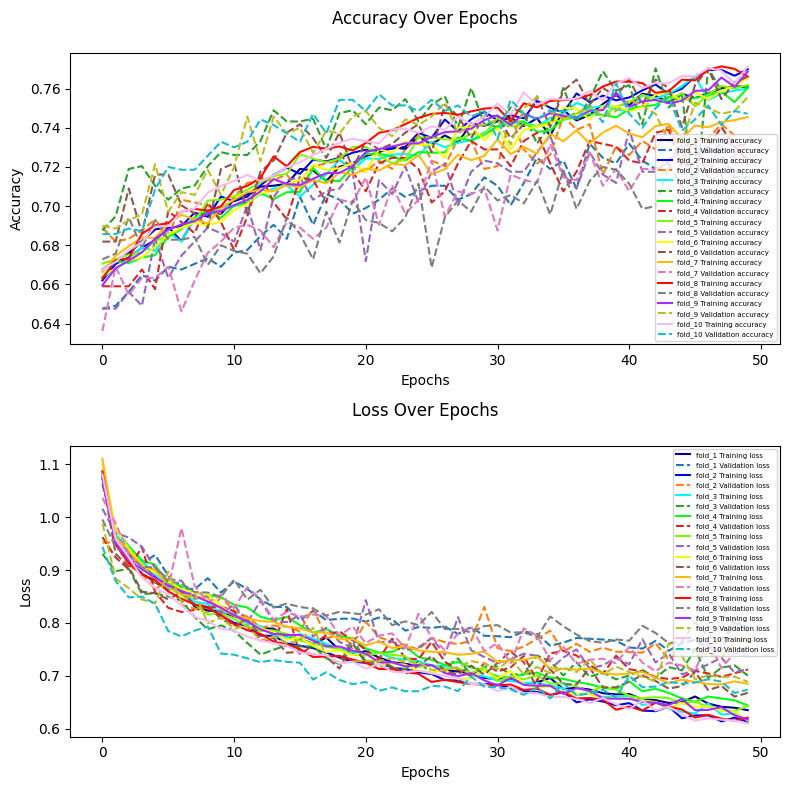

In [83]:
plot_results(cnn_combined_results)

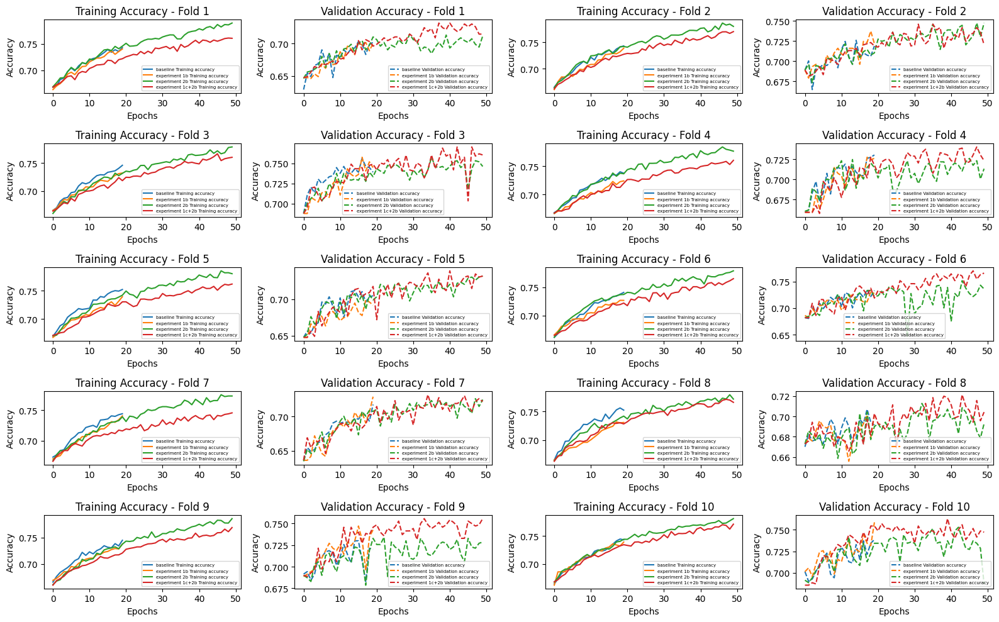

(3,
                               name train_mean train_std  val_mean   val_std  \
 baseline                  baseline     0.7447  0.004346  0.719565    0.0154   
 experiment 1b        experiment 1b   0.734948  0.005695  0.724423  0.020296   
 experiment 2b        experiment 2b   0.779601  0.005055  0.721984  0.019543   
 experiment 1c+2b  experiment 1c+2b   0.762983  0.007028  0.734552  0.020178   
 
                   time_mean  time_std  
 baseline          16.416139    0.0154  
 experiment 1b     20.476492  0.020296  
 experiment 2b     36.267104  0.019543  
 experiment 1c+2b  68.463332  0.020178  )

In [84]:
compare_experiments(
    [cnn_baseline_results, cnn_deep_results2, cnn_exp2b_results, cnn_combined_results],
    ['baseline', 'experiment 1b', 'experiment 2b', 'experiment 1c+2b']
)

### Expirement 4 Transfer learning with VGG16

In [90]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 3.6 MB/s eta 0:00:00


In [92]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

x_train_resized = tf.image.resize(x_train, [32, 32])
x_test_resized = tf.image.resize(x_test, [32, 32])

exp3b_cnn_config = {
    'loss': 'categorical_crossentropy',
    'metrics': ['accuracy'],
    'batch_size': 32,
    'epochs': 20
}

def create_fined_tuned_model(config):
    model = VGG16(weights='imagenet', include_top=False, input_shape=x_train_resized.shape[1:])
    x = model.output
    x = layers.Flatten()(x)
    x = layers.Dense(1024, activation='relu')(x)
    predictions = layers.Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=model.input, outputs=predictions)
    model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss=config['loss'], metrics=config['metrics'])
    return model

fined_tuned_model = create_fined_tuned_model(exp3b_cnn_config)
print(fined_tuned_model.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_194 (InputLayer)      [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

In [93]:
x_train_resized = x_train_resized.numpy()
exp3b_cnn_results = train_model(create_fined_tuned_model, exp3b_cnn_config, x_train_resized, y_train)

<ipython-input-10-88c427ca51a0>:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('gist_ncar')  # Choose a colormap that provides a good range of colors


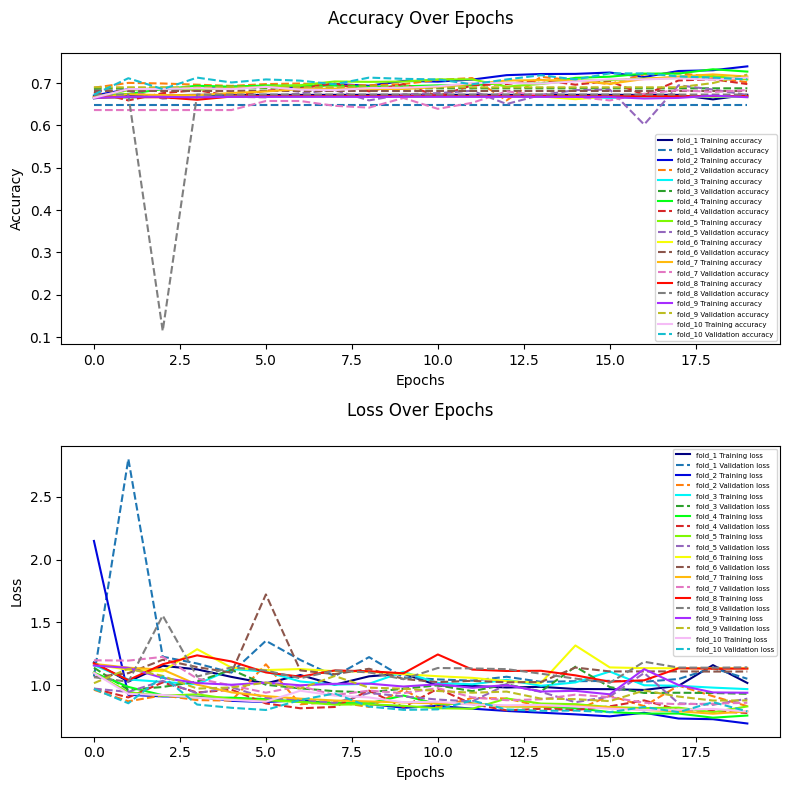

In [94]:
plot_results(exp3b_cnn_results)

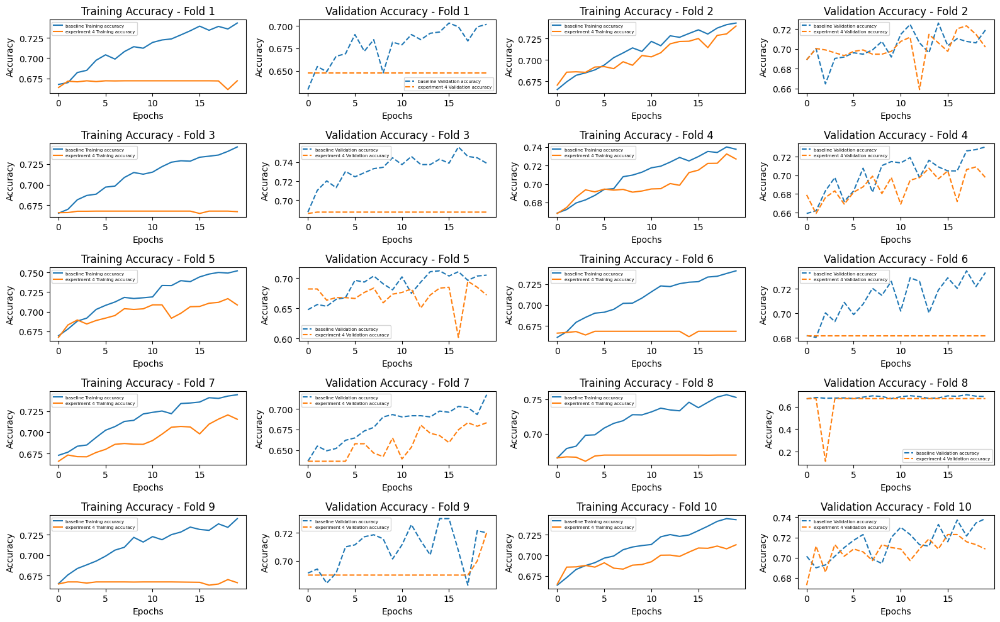

(0,
                       name train_mean train_std  val_mean   val_std  \
 baseline          baseline     0.7447  0.004346  0.719565    0.0154   
 experiment 4  experiment 4   0.694703  0.027178  0.687318  0.019755   
 
                time_mean  time_std  
 baseline       16.416139    0.0154  
 experiment 4  135.776545  0.019755  )

In [96]:
compare_experiments([cnn_baseline_results, exp3b_cnn_results], ['baseline', 'experiment 4'])

## Train the model

### MLP Model

In [86]:
mlp_model = create_model(mlp_comb_config)
mlp_model.fit(x_train_flat, y_train,
              batch_size=mlp_comb_config['batch_size'],
              epochs=mlp_comb_config['epochs'],
              callbacks=mlp_comb_config.get('calbacks', None),
              verbose=mlp_comb_config.get('verbose', 0))

### CNN Model

In [87]:
cnn_model = create_model(cnn_combined_config)
cnn_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
cnn_model.fit(x_train, y_train,
              batch_size=cnn_combined_config['batch_size'],
              epochs=cnn_combined_config['epochs'],
              callbacks=cnn_combined_config.get('calbacks', None),
              verbose=cnn_combined_config.get('verbose', 0))

## Evaluate the trained model

### CNN Model


In [88]:
cnn_score = cnn_model.evaluate(x_test, y_test)
print("Test accuracy:", cnn_score[1])

63/63 [==============================] - 0s 5ms/step - loss: 0.7009 - accuracy: 0.7322
Test accuracy: 0.7321695685386658


### MLP Model

In [89]:
mlp_score = mlp_model.evaluate(x_test_flat, y_test)
print("Test accuracy:", mlp_score[1])

63/63 [==============================] - 0s 4ms/step - loss: 0.8294 - accuracy: 0.6973
Test accuracy: 0.697256863117218
